# ERC-4626: best performing stablecoin vaults

TL; DR: [Jump the results to the list of currently best performing vaults](#Top-50-popular-vaults-by-last-three-months-returns) or [1 -month rolling return charts of best vaults](#Vault-rolling-returns-benchmark)

This notebook serves both as a coding tutorial and a useful data analytics tool for ERC-4626 vaults. 

- In this notebook, we find the best ERC-4626 vaults by their historical performance   
    - We analyse the vault performance by its share price, as reported by ERC-4626 smart contract interface.  Note that his share price method may introduce errors to various vaults needing manual cleanup.
    - We look [returns](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr), Sharpe and Sortino
- For the full list of benchmarked vaults. [see the earlier notebook](./erc-4626-vault-list.html)
- Because of how vault metrics, share price and such are collected and interpreted, the results in this notebook contain various inaccuracies.
  This is due to ERC-4626 missing features regarding fees, lockups, rebases and such that may affect the interpretation of the results.

In this notebook, we use terms Net Asset Value (NAV) and [Total Value Locked (TVL)](https://tradingstrategy.ai/glossary/total-value-locked-tvl) interchangeably.

## Usage

- Read general instructions [how to run the tutorials](./)
- See `ERC-4626 scanning all vaults onchain` example in tutorials first how to build a vault database as local `vault_db.pickle` file.
- See `ERC-4626: scanning vaults' historical price and performance` example in tutorials first how to build `vault-prices.parquet` file.

## Vault notes

For the context of the different vaults later in this notebook.

- [About Gains Network DAI (gDAI)](https://gains.trade/vaults/gDAI): Deposit DAI in exchange for gDAI, an ERC-20 representing your ownership in the vault. Stakers receive fees from each trade placed on the platform in exchange for serving as the counterparty to all trades. gDAI accumulates these fees in real-time.
- [About Ostium Vault (ostiumLP)](https://ostium.app/vault): Earn fractional trading and liquidation fees with $OLP by providing liquidity with staked USDC. This pool acts as the ultimate backstop for trade settlement.
- [About 40acres](https://www.40acres.finance/): The vault named "Vault" on Base is [40acres.finance](https://www.40acres.finance/). 40acres forget the name their vault in idenfiable manner.
- [About Revert Lend](https://revert.finance/#/lending): Earn a variable interest by lending USDC to AMM LPs.  It allows users to collateralize their Uniswap v3 liquidity provider positions, in the form of the Uniswap NFTManager NFTs, and obtain loans in a protocol-determined ERC-20 token. The protocol is specifically designed to allow Liquidity Providers to maintain control over the capital in their positions while they are collateralized. This feature facilitates uninterrupted management and optimization of LP positions, catering to the dynamic needs of liquidity providers.
- [About Peapods](https://peapods.finance/app): Peapods pioneered the concept of Volatility Farming; The ability to bring together two uncorrelated assets into an LP position to farm the volatility between the assets and tokenize it as yield. protocols, or earning fees from wrapping/unwrapping.
- [About D2.finance and HYPE++](https://gitbook.d2.finance/): D2 Finance is provides Tokenized DeFi Derivatives Strategies delivering superior risk-adjusted returns, with full on-chain transparency. HYPE++ vault is an Arbitrum vault that trades on Hyperliquid through briding. HYPE++ will take advantage of the current funding rate arbitrage to provide boosted risk-adjusted returns. The hedging mechanism using so called “Ghost VC tokens” provides a risk management layer. HYPE++ identifies and shorts tokens which are overvalued in the market creating an inverse position which can offset potential market downturns, effectively reducing strategy market beta risk.
 -[About dgnHYPE](https://www.dsquaredcap.com/): A proprietary trading strategy "DSquared Investment Vault V0 " by D Squared Capital. 
DSQ is a global investment firm employing a differentiated investment strategy to some of the world’s most exciting companies. We act as a transformative capital source to businesses, providing founders and companies solutions that offer value creation across ever changing markets.


## Setup

- Set up notebook rendering output mode
- Use static image charts so this notebook is readeable on Github / ReadTheDocs

In [1]:
import pandas as pd
from plotly.offline import init_notebook_mode
import plotly.io as pio

from eth_defi.vault.base import VaultSpec

pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_columns = None
pd.options.display.max_rows = None


# Set up Plotly chart output as SVG
image_format = "png"
width = 1400
height = 800

 # https://stackoverflow.com/a/52956402/315168
init_notebook_mode()

# https://stackoverflow.com/a/74609837/315168
assert hasattr(pio, "kaleido"), "Kaleido rendering backend missing. Run 'pip install kaleido' needed for this notebook"
pio.kaleido.scope.default_format = image_format

# https://plotly.com/python/renderers/#overriding-the-default-renderer
pio.renderers.default = image_format

current_renderer = pio.renderers[image_format]
# Have SVGs default pixel with
current_renderer.width = width
current_renderer.height = height

try:
    # Optionally make charts easier to share on Twitter
    from tradeexecutor.utils.notebook import set_large_plotly_chart_font
    set_large_plotly_chart_font(line_width=5, legend_font_size=16)
    pio.templates.default = "custom"
except ImportError:
    print("Could not import set_large_plotly_chart_font() from tradeexecutor.utils.notebook and set large output font. ")
    pio.templates.default = "plotly_white"

## Read previously scanned vault price data

- Read the Parquet file produced earlier with price scan 

In [2]:
import pickle
from pathlib import Path

output_folder = Path("~/.tradingstrategy/vaults").expanduser()
parquet_file = output_folder / "vault-prices.parquet"
assert parquet_file.exists(), "Run the vault scanner script first"

vault_db = output_folder / "vault-db.pickle"
assert vault_db.exists(), "Run the vault scanner script first"
vault_db = pickle.load(open(vault_db, "rb"))

try:
    prices_df = pd.read_parquet(parquet_file)
except Exception as e:
    raise RuntimeError(f"Could not read: {parquet_file}: {e}") from e

chains = prices_df["chain"].unique()

print(f"We have {len(prices_df):,} price rows and {len(vault_db)} vault metadata entries for {len(chains)} chains")

sample_vault = next(iter(vault_db.values()))
print("We have vault metadata keys: ", ", ".join(c for c in sample_vault.keys()))
display(pd.Series(sample_vault))

print("We have prices DataFrame columns: ", ", ".join(c for c in prices_df.columns))
print("DataFrame sample:")
display(prices_df.head())

We have 1,804,555 price rows and 8067 vault metadata entries for 16 chains
We have vault metadata keys:  Symbol, Name, Address, Denomination, NAV, Protocol, Mgmt fee, Perf fee, Shares, First seen, _detection_data, _denomination_token, _share_token


Symbol                                             fBPT-50STABAL3-50WETH
Name                                           FARM_BPT-50STABAL3-50WETH
Address                       0xdfa7578b8187f5dd1d0cb9d86b6dd33625895cf2
Denomination                                        BPT-50STABAL3-50WETH
NAV                                                 0.042399649489411407
Protocol                                                 Harvest Finance
Mgmt fee                                                            None
Perf fee                                                            None
Shares                                              0.042300245583425379
First seen                                           2023-08-04 15:37:57
_detection_data        ERC4262VaultDetection(chain=8453, address='0xd...
_denomination_token    {'name': 'Balancer 50 STABAL3 50 WETH', 'symbo...
_share_token           {'name': 'FARM_BPT-50STABAL3-50WETH', 'symbol'...
dtype: object

We have prices DataFrame columns:  chain, address, block_number, timestamp, share_price, total_assets, total_supply, performance_fee, management_fee, errors
DataFrame sample:


,chain,address,block_number,timestamp,share_price,total_assets,total_supply,performance_fee,management_fee,errors
0,43114,0x886b2a3dc127c1122c005669f726d5d37a135411,14922297,2022-05-20 00:57:04,1.00,100.00,100.00,NaN,NaN,
1,43114,0x886b2a3dc127c1122c005669f726d5d37a135411,14965497,2022-05-21 00:52:46,1.00,100.00,100.00,NaN,NaN,
2,43114,0x886b2a3dc127c1122c005669f726d5d37a135411,15008697,2022-05-22 00:59:12,1.00,100.00,100.00,NaN,NaN,
3,43114,0x886b2a3dc127c1122c005669f726d5d37a135411,15051897,2022-05-23 01:03:10,1.00,100.00,100.00,NaN,NaN,
4,43114,0x886b2a3dc127c1122c005669f726d5d37a135411,15095097,2022-05-24 01:22:00,1.00,100.00,100.00,NaN,NaN,


## Transform data

- Combine columns from metadata database with price series for easier manipulation

In [3]:
from eth_defi.chain import get_chain_name


vaults_by_id = {
    f"{vault['_detection_data'].chain}-{vault['_detection_data'].address}": vault for vault in vault_db.values()
}

# We use name later as DF index, so we need to make sure they are unique
counter = 1
used_names = set()
for id, vault in vaults_by_id.items():
    if vault["Name"] in used_names:
        chain_name = get_chain_name(vault["_detection_data"].chain)
        vault["Name"] = f"{vault['Name']} ({chain_name}) #{counter}"
        counter += 1

    used_names.add(vault["Name"])

print(f"Fixed {counter} duplicate vault names")


# Vaults are identified by their chain and address tuple, make this one human-readable column 
# to make DataFrame wrangling easier
prices_df['id'] = prices_df['chain'].astype(str) + '-' + prices_df['address'].astype(str)
prices_df['name'] = prices_df['id'].apply(lambda x: vaults_by_id[x]['Name'] if x in vaults_by_id else None)
prices_df['event_count'] = prices_df['id'].apply(lambda x: vaults_by_id[x]['_detection_data'].deposit_count + vaults_by_id[x]['_detection_data'].redeem_count)
prices_df['protocol'] = prices_df['id'].apply(lambda x: vaults_by_id[x]['Protocol'] if x in vaults_by_id else None)

# 40acres fix - they did not name their vault,
# More about this later
prices_df['name'] = prices_df['name'].fillna("<unknown>")
prices_df.loc[prices_df['name'].str.startswith("Vault (Base)"), 'name'] = "40acres (Base)"

display(prices_df.head(1))

Fixed 3162 duplicate vault names


,chain,address,block_number,timestamp,share_price,total_assets,total_supply,performance_fee,management_fee,errors,id,name,event_count,protocol
0,43114,0x886b2a3dc127c1122c005669f726d5d37a135411,14922297,2022-05-20 00:57:04,1.00,100.00,100.00,NaN,NaN,,43114-0x886b2a3dc127c1122c005669f726d5d37a135411,Savor USD Coin Vault,11,<unknown ERC-4626>


## Filter down to USD-based vaults

- In this notebooks, we focus on stablecoin yield
- Do not consider WETH, other native token vaults, as their returns calculation 
  would need to match the appreciation of underlying assets
- [is_stablecoin_like](https://web3-ethereum-defi.readthedocs.io/api/core/_autosummary/eth_defi.token.is_stablecoin_like.html?highlight=is_stablecoin_like#eth_defi.token.is_stablecoin_like) supports GHO, crvUSD and other DeFi/algorithmic stablecoins
- Note that this picks up very few EUR and other fiat-nominated vaults


In [4]:
from eth_defi.token import is_stablecoin_like

usd_vaults = [v for v in vault_db.values() if is_stablecoin_like(v["Denomination"])]
print(f"We have {len(usd_vaults)} stablecoin-nominated vaults out of {len(vault_db)} total vaults")

# Build chain-address strings for vaults we are interested in
allowed_vault_ids = set(str(v["_detection_data"].chain) + "-" + v["_detection_data"].address for v in usd_vaults)

# Filter out prices to contain only data for vaults we are interested in
prices_df = prices_df.loc[prices_df["id"].isin(allowed_vault_ids)]
print(f"Filtered out prices have {len(prices_df):,} rows")

We have 2833 stablecoin-nominated vaults out of 8067 total vaults
Filtered out prices have 654,421 rows


## Calculate return series for all vaults

- Build daily returns for all vaults we have some good data

In [5]:

def calculate_daily_returns(df_work):
    """Calculate daily returns for each vault in isolation"""

    # Group by chain and address, then resample and forward fill

    df_work = df_work.set_index("timestamp")

    result_dfs = []
    for (chain_val, addr_val), group in df_work.groupby(['chain', 'address']):
        # Resample this group to daily frequency and forward fill
        resampled = group.resample('D').ffill()
        
        # Calculate daily returns
        resampled['daily_returns'] = resampled['share_price'].pct_change(fill_method=None).fillna(0)
        
        # Add back the groupby keys as they'll be dropped during resampling
        resampled['chain'] = chain_val
        resampled['address'] = addr_val
        
        result_dfs.append(resampled)

    # Concatenate all the processed groups
    df_result = pd.concat(result_dfs)
    
    return df_result

returns_df = calculate_daily_returns(prices_df)

print("All returns DataFrame sample data:")
display(returns_df.head())


All returns DataFrame sample data:


,chain,address,block_number,share_price,total_assets,total_supply,performance_fee,management_fee,errors,id,name,event_count,protocol,daily_returns
timestamp,,,,,,,,,,,,,,
2024-01-11,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
2024-01-12,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"18,985,099.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1529,"1,599.00",<unknown ERC-4626>,0.00
2024-01-13,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"18,992,299.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1529,"1,599.00",<unknown ERC-4626>,0.00
2024-01-14,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"18,999,499.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1529,"1,599.00",<unknown ERC-4626>,0.00
2024-01-15,1,0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,"19,006,699.00",1.00,1.00,1.00,NaN,NaN,,1-0x0022228a2cc5e7ef0274a7baa600d44da5ab5776,Staked USDA (Ethereum) #1529,"1,599.00",<unknown ERC-4626>,0.00


## Calculate lifetime, annual and 3M returns for each vault

- Calculate compounding annual return ([CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr) )and lifetime returns for all price series
- We also calculate returns for the last three months, reflecting the recent performance
- You can benchmark numbers on protocol-maintained frontends, example: [Yearn: DAI to yvUSDS Farmer](https://yearn.fi/vaults/1/0x6acEDA98725505737c0F00a3dA0d047304052948?tab=about)
- CAGR, returns, etc. are expressed in raw values: 0.01 means 1% return
- Calculate volatility so we can separate actively trading vaults (market making, such) from passive vaults (lending optimisaiton)

To clean the data, we filter out based on 
- Too high NAV value (broken tokens?)
- Too min NAV value (test vaults)
- Not enough deposit and redemption activity

**Note**: These are gross returns. Due to lack of standardisation on vault fee structure, maintaining fee data is mostly manual job.

In [6]:
import warnings
import numpy as np

from eth_defi.chain import get_chain_name

three_months_ago = pd.Timestamp.now() - pd.DateOffset(months=3)

def calculate_lifetime_metrics(df):
    results = []
    
    for id_val, group in df.groupby('id'):
        # Sort by timestamp just to be safe
        group = group.sort_index()
        name = vaults_by_id[id_val]['Name'] if id_val in vaults_by_id else None
        
        # Calculate lifetime return using cumulative product approach
        lifetime_return = (1 + group['daily_returns']).prod() - 1

        last_three_months = group['daily_returns'].loc[three_months_ago:]
        three_month_returns = (1 + last_three_months).prod() - 1

        # Calculate volatility so we can separate actively trading vaults (market making, such) from passive vaults (lending optimisaiton)
        three_months_volatility = last_three_months.std()

        max_nav = group['total_assets'].max()
        current_nav = group['total_assets'].iloc[-1]
        chain_id = group['chain'].iloc[-1]
        mgmt_fee = group['management_fee'].iloc[-1]
        perf_fee = group['performance_fee'].iloc[-1]
        event_count = group['event_count'].iloc[-1]
        protocol = group['protocol'].iloc[-1]
        
        # Calculate CAGR
        # Get the first and last date
        start_date = group.index.min()
        end_date = group.index.max()
        years = (end_date - start_date).days / 365.25        
        cagr = (1 + lifetime_return) ** (1 / years) - 1 if years > 0 else np.nan

        # Calculate 3 months CAGR
        # Get the first and last date
        start_date = last_three_months.index.min()
        end_date = last_three_months.index.max()
        three_months_cagr = (1 + three_month_returns) ** (1 / years) - 1 if years > 0 else np.nan

        results.append({            
            'name': name,
            'cagr': cagr,
            'lifetime_return': lifetime_return,            
            'three_months_cagr': three_months_cagr,
            "three_months_volatility": three_months_volatility,
            'denomination': vaults_by_id[id_val]['Denomination'] if id_val in vaults_by_id else None,
            'chain': get_chain_name(chain_id),            
            'peak_nav': max_nav,            
            'current_nav': current_nav,
            'years': years, 
            "mgmt_fee": mgmt_fee,
            "perf_fee": perf_fee,
            "event_count": event_count,
            "protocol": protocol,
            'id': id_val,
            'three_months_returns': three_month_returns,            
            'start_date': start_date,
            'end_date': end_date,

        })
    
    return pd.DataFrame(results)


# Numpy complains about something
# - invalid value encountered in reduce
# - Boolean Series key will be reindexed to match DataFrame index. 
with warnings.catch_warnings():
    warnings.simplefilter("ignore", UserWarning)
    warnings.simplefilter("ignore", RuntimeWarning)
    lifetime_data_df = calculate_lifetime_metrics(returns_df)

lifetime_data_df = lifetime_data_df.sort_values(by='cagr', ascending=False)
lifetime_data_df = lifetime_data_df.set_index('name') 

assert not lifetime_data_df.index.duplicated().any(), f"There are duplicate ids in the index: {lifetime_data_df.index}"

# Verify we no longer have duplicates
# display(lifetime_data_df.index)
assert not lifetime_data_df.index.dropna().duplicated().any(), f"There are still duplicate names in the index: {lifetime_data_df.index}"
print("Successfully made all vault names unique by appending chain information")

print(f"Calculated lifetime data for {len(lifetime_data_df):,} vaults")
print("Sample entrys of lifetime data:")
display(lifetime_data_df.tail(1))

#
# Clean data
#

# Filter FRAX vault with broken interface
lifetime_data_df = lifetime_data_df[~lifetime_data_df.index.isna()]

# Filter out MAAT Stargate V2 USDT	
# Not sure what's going on with this one and other ones with massive returns.
# Rebase token?
# Consider 10,000x returns as "valid"
lifetime_data_df = lifetime_data_df[lifetime_data_df["cagr"] < 10_000]

# Filter out some vaults that report broken NAV
broken_max_nav_value = 99_000_000_000
broken_mask = lifetime_data_df['peak_nav'] > broken_max_nav_value
print(f"Vault entries with too high NAV values filtered out: {len(lifetime_data_df[broken_mask])}")
lifetime_data_df = lifetime_data_df[~broken_mask]

# Filter out some vaults that have too little NAV (ATH NAV)
lifetime_min_nav_threshold = 100.00
broken_mask = lifetime_data_df['peak_nav'] <= lifetime_min_nav_threshold
print(f"Vault entries with too small ATH NAV values filtered out: {len(lifetime_data_df[broken_mask])}")
lifetime_data_df = lifetime_data_df[~broken_mask]

# Filter out some vaults that have not seen many deposit and redemptions 
min_events = 25
broken_mask = lifetime_data_df['event_count'] < min_events
print(f"Vault entries with too few deposit and redeem events (min {min_events}) filtered out: {len(lifetime_data_df[broken_mask])}")
lifetime_data_df = lifetime_data_df[~broken_mask]


Successfully made all vault names unique by appending chain information
Calculated lifetime data for 1,644 vaults
Sample entrys of lifetime data:


,cagr,lifetime_return,three_months_cagr,three_months_volatility,denomination,chain,peak_nav,current_nav,years,mgmt_fee,perf_fee,event_count,protocol,id,three_months_returns,start_date,end_date
name,,,,,,,,,,,,,,,,,
FS_20230712_xxxxxx,-1.00,-1.00,"373,269,530.99","302,434,424,040,762.81",EURe,Ethereum,"49,370.10","6,988.91",1.73,NaN,NaN,476.00,<unknown ERC-4626>,1-0xc067dce92f48f967da11f03c7f2f06cc9ceab1eb,"679,761,550,713,557.38",2025-01-24,2025-04-21


Vault entries with too high NAV values filtered out: 1
Vault entries with too small ATH NAV values filtered out: 251
Vault entries with too few deposit and redeem events (min 25) filtered out: 361


## Top 50 vaults: historical performance, including dead ones

- Sorted by lifetime returns, the current three month returns displayed as well
- Vaults may be dead today with zero NAV/TVL
- Reasons why NAV drops to zero may include: hacks, rug pulls, etc.
- Share price calculation for low TVL vaults may have various inaccuracies because vaults implement vesting/locking mechanisms which are not visible in the share price

In [7]:
def format_lifetime_table(df: pd.DataFrame) -> pd.DataFrame:
    """Format table for human readable output"""

    df = df.copy()
    df["cagr"] = df["cagr"].apply(lambda x: f"{x:.2%}")
    df["lifetime_return"] = df["lifetime_return"].apply(lambda x: f"{x:.2%}")
    df["three_months_cagr"] = df["three_months_cagr"].apply(lambda x: f"{x:.2%}")
    df["three_months_returns"] = df["three_months_returns"].apply(lambda x: f"{x:.2%}")
    df["event_count"] = df["event_count"].apply(lambda x: f"{x:,}")
    df["mgmt_fee"] = df["mgmt_fee"].apply(lambda x: f"{x:.2%}" if pd.notna(x) else 'unknown')
    df["perf_fee"] = df["perf_fee"].apply(lambda x: f"{x:.2%}" if pd.notna(x) else 'unknown')
    
    df = df.rename(columns={
        "cagr": "Annualised return",
        "lifetime_return": "Lifetime return",
        "three_months_cagr": "Last 3M return",
        "three_months_volatility": "3M months volatility",
        "three_months_returns": "Last 3M return",
        "event_count": "Deposit/redeem count",
        "peak_nav": "Peak TVL USD",
        "current_nav": "Current TVL USD",
        "years": "Age (years)",
        "mgmt_fee": "Management fee",
        "perft_fee": "Performance fee",
        "denomination": "Deposit token",
        "chain": "Chain",
        "protocol": "Protocol",
        "start_date": "First deposit",
        "end_date": "Last deposit",
        
    })
    return df


nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['peak_nav'] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='cagr', ascending=False)
display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 662 out of 752 total vaults
Vaults with negative returns 90 out of 752 total vaults


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
sUSDC (Ethereum) #1684,65417.91%,5942.11%,20.19%,0.01,USDC,Ethereum,"1,358,850.10",155.89,0.63,unknown,unknown,57.0,<unknown ERC-4626>,1-0x459f99d7c83bc3653b1913b62d2978b1deda01b5,12.33%,2025-01-24,2025-04-21
Morpho LlamaRisk crvUSD Vault Compounder,28592.34%,385.69%,28392.95%,0.06,crvUSD,Ethereum,"1,798,916.36",877.75,0.28,unknown,unknown,129.0,<unknown ERC-4626>,1-0x84e750c4b79482050ab25c7b3d77fff334663a53,384.74%,2025-01-24,2025-04-21
Peapods Interest Bearing USDC - 17,24110.73%,199.55%,24110.73%,0.03,USDC,Base,"60,690.86","2,133.60",0.20,unknown,unknown,191.0,Peapods,8453-0xeee75954eded526ef98a0cecc027beee4586315e,199.55%,2025-02-07,2025-04-21
BRT2: moonwell USDC,19139.36%,976.15%,2.28%,0.00,USDC,Base,"543,168.43",4.39,0.45,unknown,unknown,67.0,Baklava,8453-0x59639e20a17ead110aabaf249001ab140917c18e,1.03%,2025-01-24,2025-04-21
Aave V3 crvUSD Lender (Ethereum) #1697,3700.80%,583.62%,644.10%,0.03,crvUSD,Ethereum,"835,160.44",219.98,0.53,unknown,unknown,193.0,<unknown ERC-4626>,1-0xb0154f71912866bb69fe26ffc44779d99b9cae85,188.78%,2025-01-24,2025-04-21
Aave V3 USDS Lender,2321.82%,434.07%,140.37%,0.01,USDS,Ethereum,"3,869,616.39","147,937.22",0.53,unknown,unknown,265.0,<unknown ERC-4626>,1-0x832c30802054f60f0cedb5be1f9a0e3da2a0cab4,58.57%,2025-01-24,2025-04-21
Spark USDT Lender,2059.49%,525.76%,149.94%,0.02,USDT,Ethereum,"192,001.67",203.88,0.60,unknown,unknown,86.0,<unknown ERC-4626>,1-0xed48069a2b9982b4eec646cbfa7b81d181f9400b,72.76%,2025-01-24,2025-04-21
OkToken,1590.42%,1237.49%,0.00%,0.00,USDT,Ethereum,"214,288.94",976.40,0.92,unknown,unknown,116.0,<unknown ERC-4626>,1-0x1d10bd08a745758e601cc9a98f04d4afce3bdd22,0.00%,2025-01-24,2025-04-21
MAAT Stargate V2 USDt,1388.11%,511.75%,1.27%,0.00,USDt,Avalanche,"73,312.38",3.48,0.67,unknown,unknown,35.0,<unknown ERC-4626>,43114-0x79663ac63174bc6a8adcd2db6d0a73fd36a6c161,0.85%,2025-01-24,2025-04-21


## Top 50 vaults: historical performance, vaults still alive

- Sorted by lifetime returns
- Vaults have still meaningful TVL today


In [8]:
nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['current_nav'] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='cagr', ascending=False)
display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 411 out of 451 total vaults
Vaults with negative returns 40 out of 451 total vaults


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
Aave V3 USDS Lender,2321.82%,434.07%,140.37%,0.01,USDS,Ethereum,"3,869,616.39","147,937.22",0.53,unknown,unknown,265.0,<unknown ERC-4626>,1-0x832c30802054f60f0cedb5be1f9a0e3da2a0cab4,58.57%,2025-01-24,2025-04-21
Neko USDC Vault,726.25%,103.63%,3.25%,0.00,USDC,Base,"318,997.54","283,600.87",0.34,unknown,unknown,"1,282.0",<unknown ERC-4626>,8453-0x9dc446626034c7d1a446b66a0bd58fa7c49f5916,1.08%,2025-01-24,2025-04-21
FARM_USDC.e (ZKsync) #2810,684.80%,68.03%,685.53%,0.03,USDC.e,ZKsync,"94,421.99","32,601.88",0.25,unknown,unknown,33.0,Harvest Finance,324-0x6047987b668804506133887db55eeb0a709c73c4,68.06%,2025-01-24,2025-04-20
USDC to yvUSDS Farmer,437.88%,141.04%,416.70%,0.07,USDC,Ethereum,"4,084,947.17","3,127,219.65",0.52,unknown,unknown,170.0,<unknown ERC-4626>,1-0x602da189f5ada033e9ac7096fc39c7f44a77e942,136.03%,2025-01-24,2025-04-21
Savings GYD (Arbitrum) #972,233.71%,136.59%,3.80%,0.00,GYD,Arbitrum,"496,874.06","127,112.56",0.71,unknown,unknown,870.0,<unknown ERC-4626>,42161-0xea50f402653c41cadbafd1f788341db7b7f37816,2.70%,2025-01-24,2025-04-21
Sturdy crvUSD/yean curve USDC-crvUSD LP silo,182.90%,271.56%,1.27%,0.00,crvUSD,Ethereum,"2,158,147.00","94,844.17",1.26,unknown,unknown,100.0,<unknown ERC-4626>,1-0x6311ff24fb15310ed3d2180d3d0507a21a8e5227,1.60%,2025-01-24,2025-04-21
DAI to yvUSDS Farmer,178.18%,70.75%,166.45%,0.04,DAI,Ethereum,"5,275,453.95","3,056,848.86",0.52,unknown,unknown,178.0,<unknown ERC-4626>,1-0x6aceda98725505737c0f00a3da0d047304052948,66.94%,2025-01-24,2025-04-21
Morpho Steakhouse USDT Compounder,116.13%,24.01%,114.19%,0.01,USDT,Ethereum,"2,076,602.94","551,371.92",0.28,unknown,unknown,55.0,<unknown ERC-4626>,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,23.70%,2025-01-24,2025-04-21
Morpho Gauntlet USDT Prime Compounder,98.39%,21.08%,95.76%,0.01,USDT,Ethereum,"3,797,237.37","551,096.98",0.28,unknown,unknown,55.0,<unknown ERC-4626>,1-0x6d2981ff9b8d7edbb7604de7a65bac8694ac849f,20.63%,2025-01-24,2025-04-21


## Top 50 vaults: last three months returns, including low-activity ones

- Sorted by three months CAGR
- Include low-activity ones

In [9]:
nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['current_nav'] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

column_to_shift = "three_months_cagr"
new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 411 out of 451 total vaults
Vaults with negative returns 40 out of 451 total vaults


,Last 3M return,Annualised return,Lifetime return,3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
FARM_USDC.e (ZKsync) #2810,685.53%,684.80%,68.03%,0.03,USDC.e,ZKsync,"94,421.99","32,601.88",0.25,unknown,unknown,33.0,Harvest Finance,324-0x6047987b668804506133887db55eeb0a709c73c4,68.06%,2025-01-24,2025-04-20
USDC to yvUSDS Farmer,416.70%,437.88%,141.04%,0.07,USDC,Ethereum,"4,084,947.17","3,127,219.65",0.52,unknown,unknown,170.0,<unknown ERC-4626>,1-0x602da189f5ada033e9ac7096fc39c7f44a77e942,136.03%,2025-01-24,2025-04-21
IdleCDO BB Tranche - idle_cpPOR-USDC4626Adapter,308.58%,78.73%,222.76%,1.76,DAI,Ethereum,"10,548,140.35","327,797.72",2.02,unknown,unknown,31.0,<unknown ERC-4626>,1-0xa9f908da2e3ec7475a743e97bb5b06081b688ae4,1611.75%,2025-01-24,2025-04-21
DAI to yvUSDS Farmer,166.45%,178.18%,70.75%,0.04,DAI,Ethereum,"5,275,453.95","3,056,848.86",0.52,unknown,unknown,178.0,<unknown ERC-4626>,1-0x6aceda98725505737c0f00a3da0d047304052948,66.94%,2025-01-24,2025-04-21
Aave V3 USDS Lender,140.37%,2321.82%,434.07%,0.01,USDS,Ethereum,"3,869,616.39","147,937.22",0.53,unknown,unknown,265.0,<unknown ERC-4626>,1-0x832c30802054f60f0cedb5be1f9a0e3da2a0cab4,58.57%,2025-01-24,2025-04-21
Morpho Steakhouse USDT Compounder,114.19%,116.13%,24.01%,0.01,USDT,Ethereum,"2,076,602.94","551,371.92",0.28,unknown,unknown,55.0,<unknown ERC-4626>,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,23.70%,2025-01-24,2025-04-21
Morpho Gauntlet USDT Prime Compounder,95.76%,98.39%,21.08%,0.01,USDT,Ethereum,"3,797,237.37","551,096.98",0.28,unknown,unknown,55.0,<unknown ERC-4626>,1-0x6d2981ff9b8d7edbb7604de7a65bac8694ac849f,20.63%,2025-01-24,2025-04-21
Peapods Interest Bearing USDC - 14,87.20%,87.20%,10.85%,0.00,USDC,Arbitrum,"37,849.64","33,989.85",0.16,unknown,unknown,645.0,Peapods,42161-0xc2810eb57526df869049fbf4c541791a3255d24c,10.85%,2025-02-20,2025-04-21
dgnHYPE,74.58%,74.58%,24.00%,0.02,USDC,Arbitrum,"249,000.07","200,000.00",0.39,unknown,unknown,30.0,<unknown ERC-4626>,42161-0x64167cd42859f64cff2aa4b63c3175ccef9659dd,24.00%,2025-01-24,2025-04-21


## Top 50 popular vaults by last three months returns

<a id="top-3M"></a>

- Best performing vaults
- Sorted by three months [CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr)
- Include only vaults with significant number of deposit events over life time, or "popular vaults"


In [10]:
nav_threshold = 100_000
event_threshold = 450

lifetime_data_filtered_df = lifetime_data_df[
    (lifetime_data_df['current_nav'] >= nav_threshold) &
    (lifetime_data_df['event_count'] >= event_threshold)
]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df['lifetime_return'] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

column_to_shift = "three_months_cagr"
new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $100,000 USD
Vaults with positive returns 206 out of 220 total vaults
Vaults with negative returns 14 out of 220 total vaults


,Last 3M return,Annualised return,Lifetime return,3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
"Revert Lend Arbitrum USDC,",67.97%,-69.85%,-53.76%,0.33,USDC,Arbitrum,"1,666,636.92","978,576.82",0.64,unknown,unknown,"11,293.0",<unknown ERC-4626>,42161-0x74e6afef5705beb126c6d3bf46f8fad8f3e07825,39.61%,2025-01-24,2025-04-21
Vault (Base) #173,42.59%,42.59%,8.19%,0.00,USDC,Base,"1,256,193.78","1,256,193.78",0.22,unknown,unknown,646.0,<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,8.19%,2025-01-30,2025-04-21
Peapods Interest Bearing USDC - 67,23.81%,23.81%,1.53%,0.00,USDC,Base,"138,234.88","137,588.11",0.07,unknown,unknown,993.0,Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,1.53%,2025-03-26,2025-04-21
Gains Network USDC (Polygon) #2421,19.84%,76.93%,104.52%,0.03,USDC,Polygon,"1,040,536.58","691,187.19",1.25,unknown,unknown,678.0,<unknown ERC-4626>,137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81,25.48%,2025-01-24,2025-04-21
EVK Vault eUSDC-25,9.42%,9.42%,2.19%,0.00,USDC,Ethereum,"14,077,830.70","3,899,255.55",0.24,unknown,unknown,619.0,Euler Vault Kit,1-0x3b028b4b6c567ef5f8ca1144da4fbaa0d973f228,2.19%,2025-01-24,2025-04-21
Clearstar OpenEden USDC,9.02%,9.02%,0.97%,0.00,USDC,Base,"3,845,859.35","2,125,722.37",0.11,0.00%,15.00%,"1,939.0",Morpho,8453-0x1d3b1cd0a0f242d598834b3f2d126dc6bd774657,0.97%,2025-03-11,2025-04-21
EVK Vault eUSDC-3,8.43%,8.48%,2.05%,0.00,USDC,Base,"2,866,163.20","911,548.74",0.25,unknown,unknown,"6,642.0",Euler Vault Kit,8453-0xc063c3b3625df5f362f60f35b0bcd98e0fa650fb,2.04%,2025-01-24,2025-04-21
Gauntlet USDC Frontier,8.34%,8.34%,1.32%,0.00,USDC,Ethereum,"46,530,622.65","24,782,665.43",0.16,0.00%,0.00%,"3,525.0",Morpho,1-0xc582f04d8a82795aa2ff9c8bb4c1c889fe7b754e,1.32%,2025-02-20,2025-04-21
Hakutora USDC,8.30%,8.94%,2.18%,0.00,USDC,Ethereum,"63,480,217.72","29,652,511.89",0.25,0.00%,15.00%,"1,889.0",Morpho,1-0x974c8fbf4fd795f66b85b73ebc988a51f1a040a9,2.03%,2025-01-24,2025-04-21


## Vault rolling returns benchmark

<a id="rolling"></a>

- Here we compare the top 20 performing popular, by their 3 months returns
- We plot our annualised 1 month rolling returns on the chart, to see how vaults move in the direction of the markets, or what kind of outliers there are
- Below, we plot the same chart again without market-making vaults as their volatility shades other vaults
- We plot 1 year period, but we do not have enough history for most vaults for this time window

### Market-making vaults vs. lending vaults

You can see how market-making vaults differ from others, as their returns are much more volatile and can be negative (losing money when market is not optimal).


### All vaults, including volatile

We lack fee data for 11 / 20 vaults


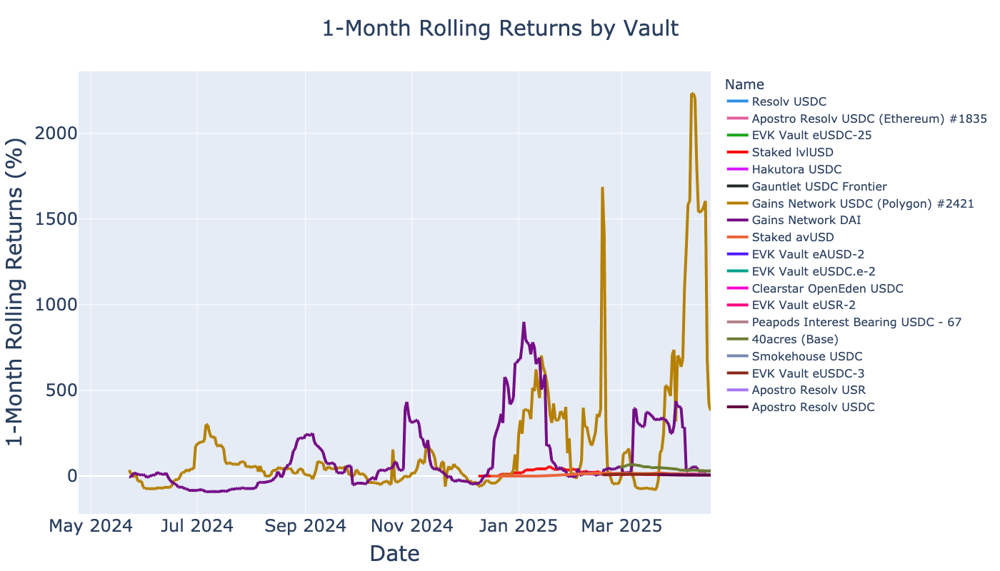

Peak returns by


timestamp                                                   2025-04-10 00:00:00
chain                                                                       137
address                              0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81
block_number                                                      70,105,934.00
share_price                                                                2.09
total_assets                                                         668,744.96
total_supply                                                         319,837.59
performance_fee                                                             NaN
management_fee                                                              NaN
errors                                                                         
id                               137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81
name                                         Gains Network USDC (Polygon) #2421
event_count                             

In [11]:
import plotly.express as px
from plotly.colors import qualitative 


benchmark_count: int = 20


def calculate_rolling_returns(
    returns_df: pd.DataFrame,
    interesting_vaults: pd.Series | None,
    window: int = 30,  # Bars
    period: pd.Timedelta = pd.Timedelta(days=365),    
    cap: float = None,
    clip_down: float=None,
    clip_up: float=None,
    drop_threshold: float = None,
):
    
    # Limit to benchmarked vaults
    if interesting_vaults is not None:
        df = returns_df[returns_df["id"].isin(interesting_vaults)]
    else:
        df = returns_df
    df = df.reset_index().sort_values(by=["id", "timestamp"])

    # Manually blacklist one vault where we get data until fixed
    df = df[df["name"] != "Revert Lend Arbitrum USDC,"]

    # Limit chart width
    df = df.loc[df["timestamp"] >= (pd.Timestamp.now() - period)]

    # Calculate rollling returns
    df['rolling_1m_returns'] = df.groupby('id')['daily_returns'].transform(
        lambda x: (((1 + x).rolling(window=window).apply(np.prod) - 1) * 100)
    )

    df['rolling_1m_returns_annualized'] = ((1 + df['rolling_1m_returns']/100) ** 12 - 1) * 100

    # When vault launches it has usually near-infinite APY
    # Cap it here so charts are readable
    if cap is not None:
        # Using mask (replaces values WHERE condition is True)
        df['rolling_1m_returns_annualized'] = df['rolling_1m_returns_annualized'].mask(
            (df['rolling_1m_returns_annualized'] > cap) | (df['rolling_1m_returns_annualized'] < -cap), 
            np.nan
        )

    if clip_down is not None:
        df['rolling_1m_returns_annualized'] = df['rolling_1m_returns_annualized'].clip(lower=clip_down)

    if clip_up is not None:
        df['rolling_1m_returns_annualized'] = df['rolling_1m_returns_annualized'].clip(upper=clip_up)

    if drop_threshold is not None:
        # Step 1: Identify vaults with extreme returns
        extreme_return_vaults = returns_df.groupby('name')['daily_returns'].apply(
            lambda x: (x > 1000).any()
        )
        extreme_return_names = extreme_return_vaults[extreme_return_vaults].index.tolist()

        print("Removing extreme return vaults: ", extreme_return_names)

        # Step 2: Filter the DataFrame to exclude these vaults
        df = df[~df['name'].isin(extreme_return_names)]
        
    return df


interesting_vaults = lifetime_data_filtered_df[0:benchmark_count]["id"]
df = rolling_returns_df = all_rolling_returns_df = calculate_rolling_returns(returns_df, interesting_vaults=interesting_vaults)

# Report manual fee data gathering needed
lack_fees_df = df[df["performance_fee"].isna()]
print(f"We lack fee data for {len(lack_fees_df['id'].unique()):,} / {len(interesting_vaults)} vaults")

# display(df.head(2))

fig = px.line(df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title='1-Month Rolling Returns by Vault',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='1-Month Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default,
)

fig.update_traces(line=dict(width=4))


fig.show()

max_row = df.loc[df['rolling_1m_returns'].idxmax()]
print("Peak returns by")
display(max_row)

### All vaults, excluding volatile

- Exclude gDAI to see other vaults better in the chart



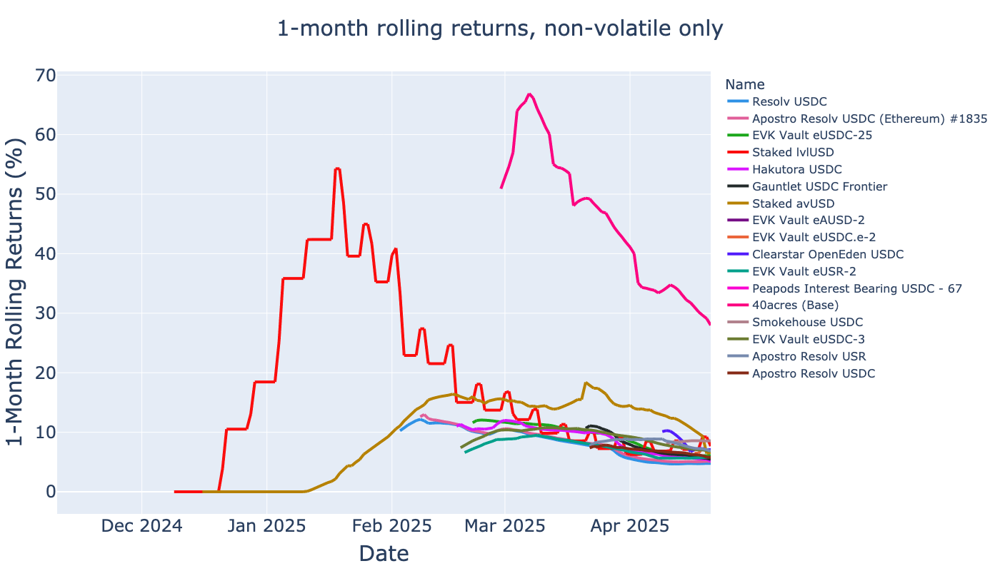

Peak returns by


timestamp                                                   2025-04-10 00:00:00
chain                                                                       137
address                              0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81
block_number                                                      70,105,934.00
share_price                                                                2.09
total_assets                                                         668,744.96
total_supply                                                         319,837.59
performance_fee                                                             NaN
management_fee                                                              NaN
errors                                                                         
id                               137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81
name                                         Gains Network USDC (Polygon) #2421
event_count                             

In [12]:
# TODO: Fix with better filtering
non_volatile_df = all_rolling_returns_df
non_volatile_df = non_volatile_df[non_volatile_df["name"].str.contains("Gains") == False]
non_volatile_df = non_volatile_df[non_volatile_df["name"].str.contains("ostium") == False]

fig = px.line(non_volatile_df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title='1-month rolling returns, non-volatile only',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='1-Month Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default
)

fig.update_traces(line=dict(width=4))

fig.show()

max_row = df.loc[df['rolling_1m_returns'].idxmax()]
print("Peak returns by")
display(max_row)

### All vaults, volatile only

- Benchmark market-making and such vaults against each other across chains.

Top volatile vaults


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Deposit token,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,,,
FARM_USDC.e (ZKsync) #2810,684.80%,68.03%,685.53%,0.03,USDC.e,ZKsync,"94,421.99","32,601.88",0.25,unknown,unknown,33.0,Harvest Finance,324-0x6047987b668804506133887db55eeb0a709c73c4,68.06%,2025-01-24,2025-04-20
USDC to yvUSDS Farmer,437.88%,141.04%,416.70%,0.07,USDC,Ethereum,"4,084,947.17","3,127,219.65",0.52,unknown,unknown,170.0,<unknown ERC-4626>,1-0x602da189f5ada033e9ac7096fc39c7f44a77e942,136.03%,2025-01-24,2025-04-21
IdleCDO BB Tranche - idle_cpPOR-USDC4626Adapter,78.73%,222.76%,308.58%,1.76,DAI,Ethereum,"10,548,140.35","327,797.72",2.02,unknown,unknown,31.0,<unknown ERC-4626>,1-0xa9f908da2e3ec7475a743e97bb5b06081b688ae4,1611.75%,2025-01-24,2025-04-21
DAI to yvUSDS Farmer,178.18%,70.75%,166.45%,0.04,DAI,Ethereum,"5,275,453.95","3,056,848.86",0.52,unknown,unknown,178.0,<unknown ERC-4626>,1-0x6aceda98725505737c0f00a3da0d047304052948,66.94%,2025-01-24,2025-04-21
Aave V3 USDS Lender,2321.82%,434.07%,140.37%,0.01,USDS,Ethereum,"3,869,616.39","147,937.22",0.53,unknown,unknown,265.0,<unknown ERC-4626>,1-0x832c30802054f60f0cedb5be1f9a0e3da2a0cab4,58.57%,2025-01-24,2025-04-21
Morpho Steakhouse USDT Compounder,116.13%,24.01%,114.19%,0.01,USDT,Ethereum,"2,076,602.94","551,371.92",0.28,unknown,unknown,55.0,<unknown ERC-4626>,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,23.70%,2025-01-24,2025-04-21
Morpho Gauntlet USDT Prime Compounder,98.39%,21.08%,95.76%,0.01,USDT,Ethereum,"3,797,237.37","551,096.98",0.28,unknown,unknown,55.0,<unknown ERC-4626>,1-0x6d2981ff9b8d7edbb7604de7a65bac8694ac849f,20.63%,2025-01-24,2025-04-21
dgnHYPE,74.58%,24.00%,74.58%,0.02,USDC,Arbitrum,"249,000.07","200,000.00",0.39,unknown,unknown,30.0,<unknown ERC-4626>,42161-0x64167cd42859f64cff2aa4b63c3175ccef9659dd,24.00%,2025-01-24,2025-04-21
"Revert Lend Arbitrum USDC,",-69.85%,-53.76%,67.97%,0.33,USDC,Arbitrum,"1,666,636.92","978,576.82",0.64,unknown,unknown,"11,293.0",<unknown ERC-4626>,42161-0x74e6afef5705beb126c6d3bf46f8fad8f3e07825,39.61%,2025-01-24,2025-04-21


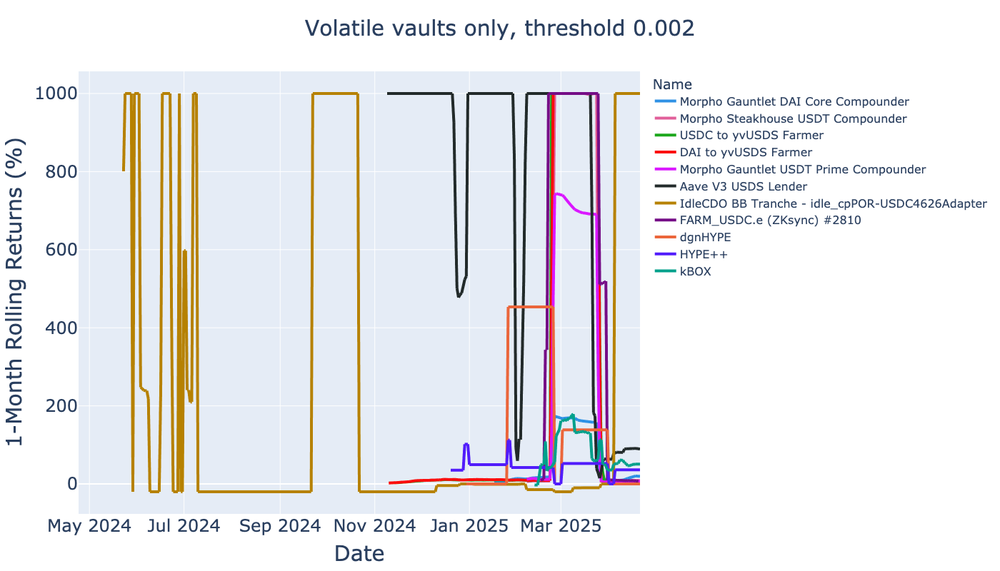

In [13]:
volatility_threshold = 0.002
benchmark_count = 20
nav_threshold = 25_000
lifetime_data_filtered_df = lifetime_data_df[
    (lifetime_data_df['current_nav'] >= nav_threshold) &
    (lifetime_data_df['event_count'] >= event_threshold)
]

lifetime_data_filtered_df = lifetime_data_df
lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df['current_nav'] > nav_threshold]
lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

lifetime_data_filtered_df = lifetime_data_filtered_df.iloc[0:benchmark_count]
interesting_vaults = lifetime_data_filtered_df[lifetime_data_filtered_df['three_months_volatility'] > volatility_threshold]

interesting_vaults = interesting_vaults.iloc[0:benchmark_count]


rolling_returns_df = calculate_rolling_returns(
    returns_df, 
    interesting_vaults=set(interesting_vaults["id"]),
    clip_down=-20,
    clip_up=1000,
    window=30,
    )

print("Top volatile vaults")
display(format_lifetime_table(interesting_vaults))

fig = px.line(rolling_returns_df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title=f'Volatile vaults only, threshold {volatility_threshold}',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )


fig.update_layout(
    xaxis_title='Date',
    yaxis_title='1-Month Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default
)

fig.update_traces(line=dict(width=4))

fig.show()



### All vaults, volatile only, filtering extreme results

- Remove vaults with seemingly bad returns
- TODO: This seems be very difficult to analyse

Total 18 interesting volatile vaults: ['USDC to yvUSDS Farmer', 'DAI to yvUSDS Farmer', 'Morpho Steakhouse USDT Compounder', 'Morpho Gauntlet USDT Prime Compounder', 'Revert Lend Arbitrum USDC,', 'kBOX', 'HYPE++', 'Gains Network USDC (Polygon) #2421', 'Gains Network DAI', 'Gains Network DAI (Polygon) #2213', 'gmUSDC (Arbitrum) #780', 'ostiumLP', 'hsUSDC', 'Gains Network USDC (Arbitrum) #792', 'Gains Network USDC', 'FJ_20230712_xxxxxx', 'kUSDT', 'kUSDC']
Removing extreme return vaults:  ['0xMon - PF', 'Apyflow Uniswap V3 Vault (Polygon) #2245', 'Blueberry USDC Vault LP Token - Lender to bvlGLP', 'Delta Netural GMX Vault (Senior)', 'Delta Netural GMX Vault (Senior) (Arbitrum) #372', 'Delta Netural GMX Vault (Senior) (Arbitrum) #377', 'Delta Netural GMX Vault (Senior) (Arbitrum) #422', 'FJ_20230712_xxxxxx', 'FS_20230712_xxxxxx', 'IdleCDO AA Tranche - idle_cpPOR-USDC4626Adapter', 'IdleCDO BB Tranche - idle_cpPOR-USDC4626Adapter', 'IdleUSDT Junior4626Adapter', 'Ithil Dai Stablecoin', 'Ithil

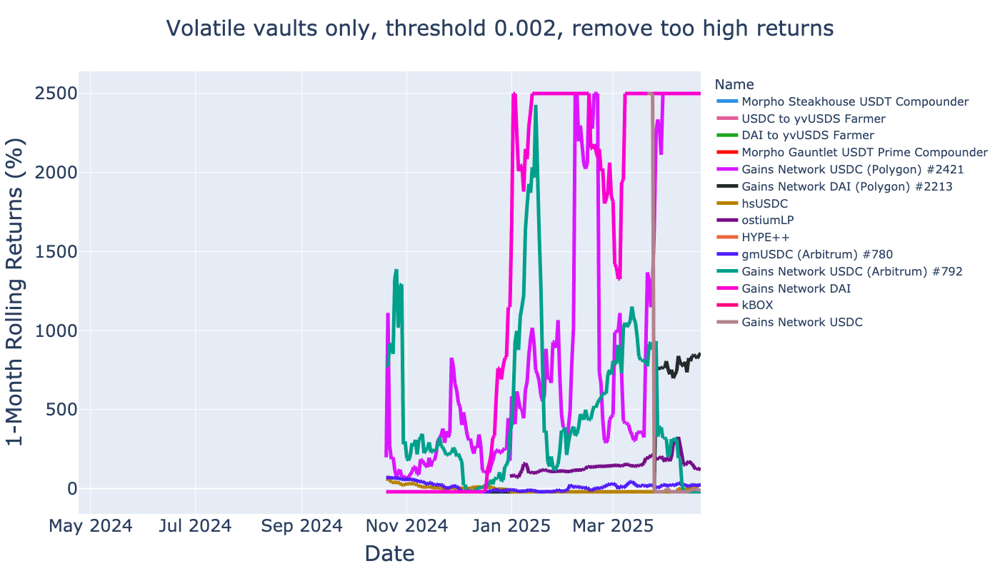

In [14]:
bad_returns_threshold = 900
benchmark_count = 15  # By the last 1-month returns
nav_threshold = 500_000

lifetime_data_filtered_df = lifetime_data_df
lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df['current_nav'] > nav_threshold]
lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)

# lifetime_data_filtered_df = lifetime_data_filtered_df.iloc[0:benchmark_count]
interesting_vaults = lifetime_data_filtered_df[lifetime_data_filtered_df['three_months_volatility'] > volatility_threshold]

# display(interesting_vaults)

print(f"Total {len(interesting_vaults)} interesting volatile vaults: {interesting_vaults.index.tolist()}")

interesting_vaults = interesting_vaults.iloc[0:benchmark_count]

rolling_returns_df = calculate_rolling_returns(
    returns_df, 
    interesting_vaults=interesting_vaults["id"],
    clip_down=-20,
    clip_up=2500,
    window=180,
    drop_threshold=100,
    )


print("Top 20 volatile vaults by the lat returns ")

fig = px.line(rolling_returns_df, 
              x='timestamp', 
              y='rolling_1m_returns_annualized',
              color='name',
              title=f'Volatile vaults only, threshold {volatility_threshold}, remove too high returns',
              labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                     'timestamp': 'Date',
                     'name': 'Name'},
              hover_data=['id'],
              color_discrete_sequence=qualitative.Dark24,
              )


fig.update_layout(
    xaxis_title='Date',
    yaxis_title='1-Month Rolling Returns (%)',
    legend_title='Name',
    hovermode='closest',
    template=pio.templates.default
)

fig.update_traces(line=dict(width=5))

fig.show()


## Top vaults by chain

- Show 1 month rolling returns of top vaults for all chains chain


### Arbitrum

Arbitrum: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 14,87.20%,10.85%,87.20%,0.00,"37,849.64","33,989.85",0.16,unknown,unknown,645.0,Peapods,42161-0xc2810eb57526df869049fbf4c541791a3255d24c,10.85%,2025-02-20,2025-04-21
dgnHYPE,74.58%,24.00%,74.58%,0.02,"249,000.07","200,000.00",0.39,unknown,unknown,30.0,<unknown ERC-4626>,42161-0x64167cd42859f64cff2aa4b63c3175ccef9659dd,24.00%,2025-01-24,2025-04-21
"Revert Lend Arbitrum USDC,",-69.85%,-53.76%,67.97%,0.33,"1,666,636.92","978,576.82",0.64,unknown,unknown,"11,293.0",<unknown ERC-4626>,42161-0x74e6afef5705beb126c6d3bf46f8fad8f3e07825,39.61%,2025-01-24,2025-04-21
HYPE++,43.30%,16.04%,24.37%,0.01,"1,000,000.00","1,000,000.00",0.41,unknown,unknown,93.0,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,9.44%,2025-01-24,2025-04-21
Peapods Interest Bearing USDC - 6,15.63%,2.86%,15.63%,0.00,"168,176.70","61,095.51",0.19,unknown,unknown,"1,138.0",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,2.86%,2025-02-09,2025-04-21


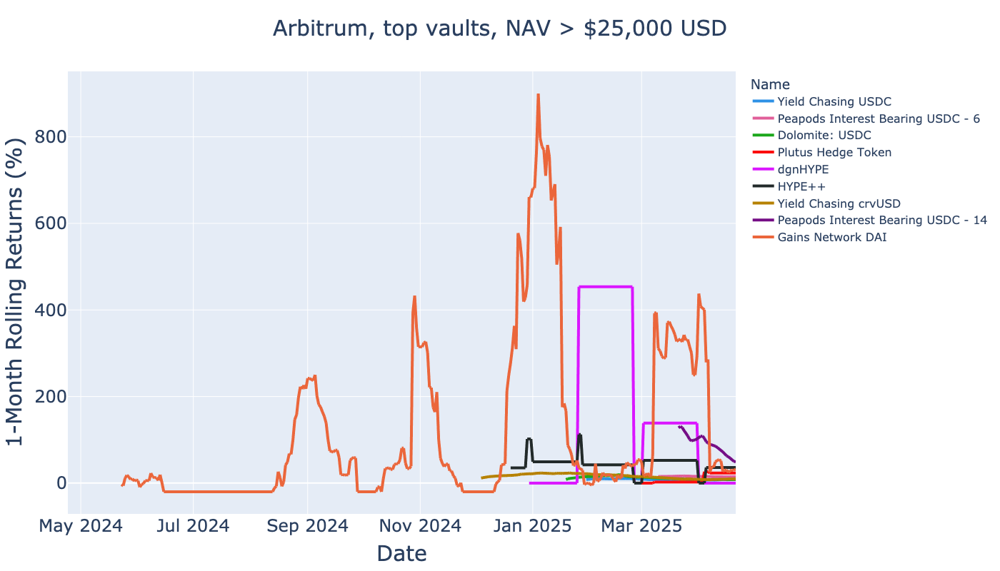

Arbitrum: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 14,87.20%,10.85%,87.20%,0.00,"37,849.64","33,989.85",0.16,unknown,unknown,645.0,Peapods,42161-0xc2810eb57526df869049fbf4c541791a3255d24c,10.85%,2025-02-20,2025-04-21
Peapods Interest Bearing USDC - 6,15.63%,2.86%,15.63%,0.00,"168,176.70","61,095.51",0.19,unknown,unknown,"1,138.0",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,2.86%,2025-02-09,2025-04-21
Plutus Hedge Token,9.31%,1.97%,9.31%,0.00,"98,804.74","98,804.74",0.22,unknown,unknown,31.0,<unknown ERC-4626>,42161-0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a,1.97%,2025-01-31,2025-04-21
Dolomite: USDC,11.54%,3.68%,8.00%,0.00,"16,436,401.25","11,152,384.93",0.33,unknown,unknown,52.0,<unknown ERC-4626>,42161-0x444868b6e8079ac2c55eea115250f92c2b2c4d14,2.58%,2025-01-24,2025-04-21
Yield Chasing USDC,8.41%,2.46%,6.94%,0.00,"340,087.95","120,625.36",0.30,unknown,unknown,202.0,<unknown ERC-4626>,42161-0x0df2e3a0b5997adc69f8768e495fd98a4d00f134,2.04%,2025-01-24,2025-04-21


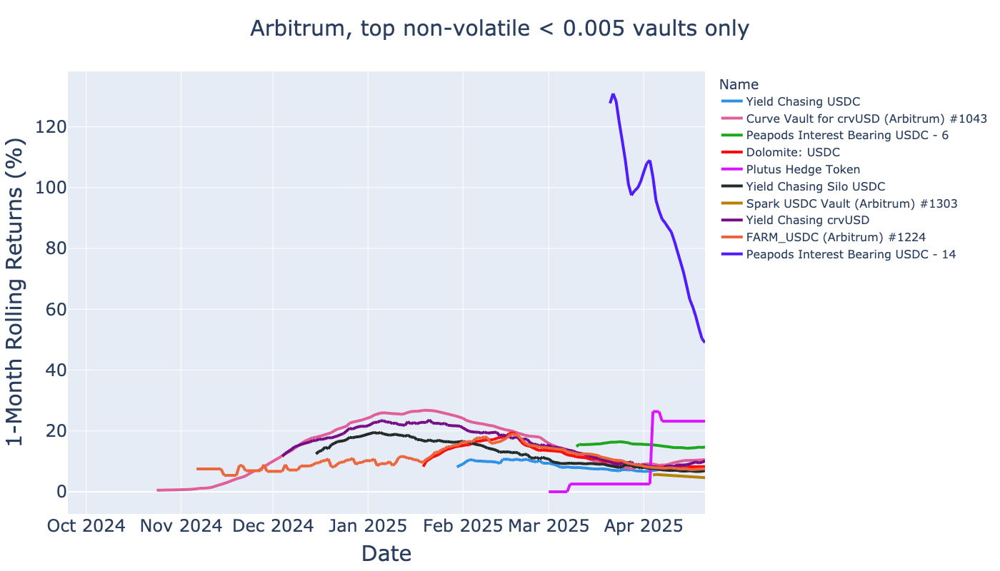

### Ethereum

Ethereum: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
USDC to yvUSDS Farmer,437.88%,141.04%,416.70%,0.07,"4,084,947.17","3,127,219.65",0.52,unknown,unknown,170.0,<unknown ERC-4626>,1-0x602da189f5ada033e9ac7096fc39c7f44a77e942,136.03%,2025-01-24,2025-04-21
IdleCDO BB Tranche - idle_cpPOR-USDC4626Adapter,78.73%,222.76%,308.58%,1.76,"10,548,140.35","327,797.72",2.02,unknown,unknown,31.0,<unknown ERC-4626>,1-0xa9f908da2e3ec7475a743e97bb5b06081b688ae4,1611.75%,2025-01-24,2025-04-21
DAI to yvUSDS Farmer,178.18%,70.75%,166.45%,0.04,"5,275,453.95","3,056,848.86",0.52,unknown,unknown,178.0,<unknown ERC-4626>,1-0x6aceda98725505737c0f00a3da0d047304052948,66.94%,2025-01-24,2025-04-21
Aave V3 USDS Lender,2321.82%,434.07%,140.37%,0.01,"3,869,616.39","147,937.22",0.53,unknown,unknown,265.0,<unknown ERC-4626>,1-0x832c30802054f60f0cedb5be1f9a0e3da2a0cab4,58.57%,2025-01-24,2025-04-21
Morpho Steakhouse USDT Compounder,116.13%,24.01%,114.19%,0.01,"2,076,602.94","551,371.92",0.28,unknown,unknown,55.0,<unknown ERC-4626>,1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5,23.70%,2025-01-24,2025-04-21


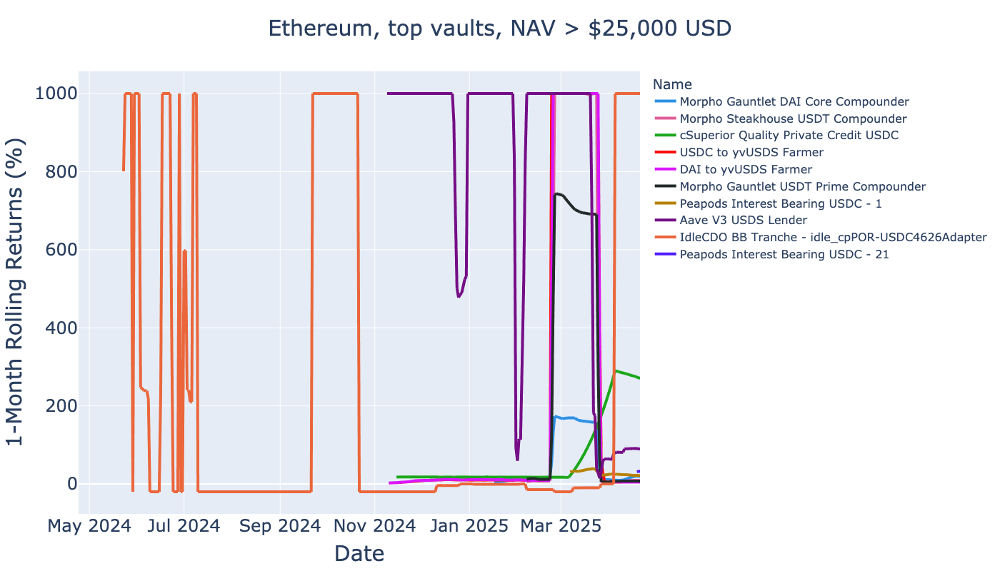

Ethereum: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
cSuperior Quality Private Credit USDC,58.31%,26.36%,45.06%,0.00,"181,726.10","169,984.08",0.51,unknown,unknown,49.0,<unknown ERC-4626>,1-0x438982ea288763370946625fd76c2508ee1fb229,20.86%,2025-01-24,2025-04-21
Morpho Gauntlet DAI Core Compounder,39.88%,11.96%,37.45%,0.00,"1,290,621.64","242,673.29",0.34,unknown,unknown,94.0,<unknown ERC-4626>,1-0x09580f2305a335218bdb2eb828387d52ed8fc2f4,11.31%,2025-01-24,2025-04-21
Peapods Interest Bearing USDC - 21,32.23%,2.40%,32.23%,0.00,"75,101.75","74,870.59",0.08,unknown,unknown,274.0,Peapods,1-0xf419c7674536f6b32b9a73929dbf4ff5c2386d5c,2.40%,2025-03-21,2025-04-21
Peapods Interest Bearing USDC - 1,27.02%,4.97%,27.02%,0.00,"50,378.46","27,075.27",0.20,unknown,unknown,90.0,Peapods,1-0x82f01dc127f78ebd3e7bec68b243f519b074fc15,4.97%,2025-02-06,2025-04-21


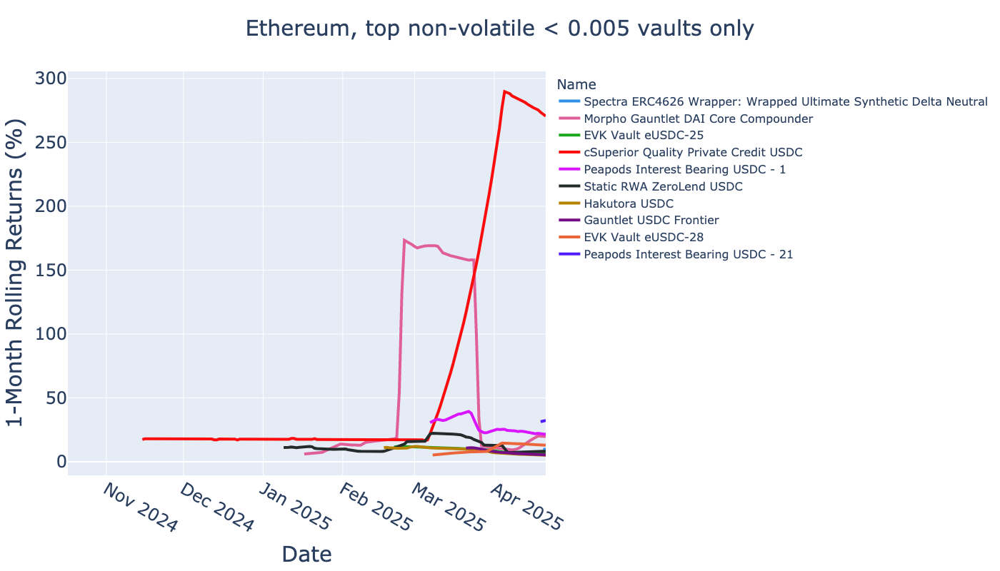

### Base

Base: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Vault (Base) #173,42.59%,8.19%,42.59%,0.00,"1,256,193.78","1,256,193.78",0.22,unknown,unknown,646.0,<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,8.19%,2025-01-30,2025-04-21
Peapods Interest Bearing USDC - 42,32.20%,5.17%,32.20%,0.00,"93,761.20","30,430.00",0.18,unknown,unknown,"1,800.0",Peapods,8453-0x4b5c90dc6bc08a10a24487726e614e9d148362e1,5.17%,2025-02-14,2025-04-21
Peapods Interest Bearing USDC - 15,28.30%,5.03%,28.30%,0.00,"91,617.57","64,029.04",0.20,unknown,unknown,"7,473.0",Peapods,8453-0x6ea0bfff586f2f226c80cc98275b810d2cd95771,5.03%,2025-02-08,2025-04-21
Peapods Interest Bearing USDC - 67,23.81%,1.53%,23.81%,0.00,"138,234.88","137,588.11",0.07,unknown,unknown,993.0,Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,1.53%,2025-03-26,2025-04-21
Peapods Interest Bearing USDC - 7,16.62%,3.42%,16.62%,0.00,"55,284.01","40,709.70",0.22,unknown,unknown,295.0,Peapods,8453-0x9c77e29e59ce30445048fa653442ee296442c350,3.42%,2025-01-31,2025-04-21


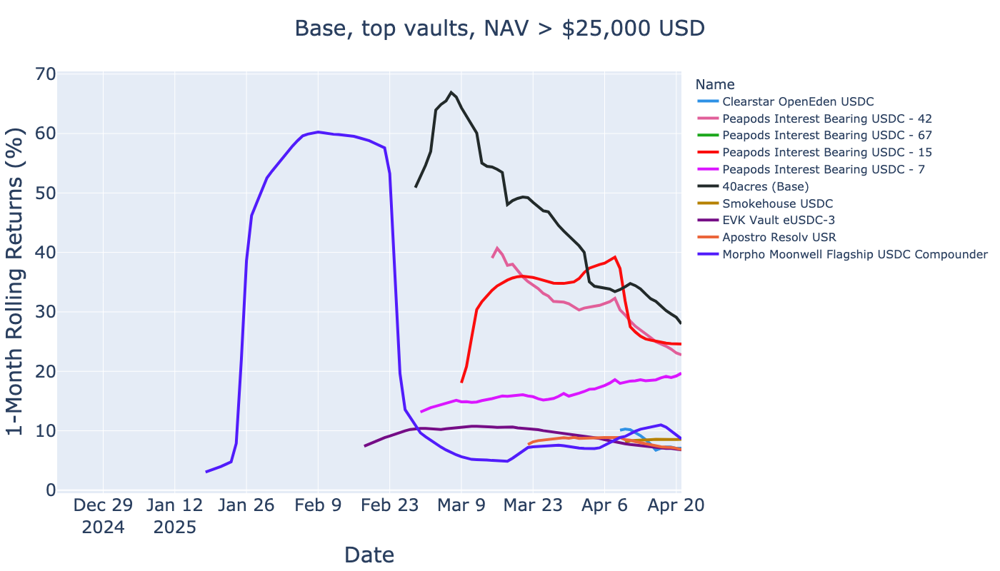

Base: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Vault (Base) #173,42.59%,8.19%,42.59%,0.00,"1,256,193.78","1,256,193.78",0.22,unknown,unknown,646.0,<unknown ERC-4626>,8453-0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5,8.19%,2025-01-30,2025-04-21
Peapods Interest Bearing USDC - 42,32.20%,5.17%,32.20%,0.00,"93,761.20","30,430.00",0.18,unknown,unknown,"1,800.0",Peapods,8453-0x4b5c90dc6bc08a10a24487726e614e9d148362e1,5.17%,2025-02-14,2025-04-21
Peapods Interest Bearing USDC - 15,28.30%,5.03%,28.30%,0.00,"91,617.57","64,029.04",0.20,unknown,unknown,"7,473.0",Peapods,8453-0x6ea0bfff586f2f226c80cc98275b810d2cd95771,5.03%,2025-02-08,2025-04-21
Peapods Interest Bearing USDC - 67,23.81%,1.53%,23.81%,0.00,"138,234.88","137,588.11",0.07,unknown,unknown,993.0,Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,1.53%,2025-03-26,2025-04-21
Peapods Interest Bearing USDC - 7,16.62%,3.42%,16.62%,0.00,"55,284.01","40,709.70",0.22,unknown,unknown,295.0,Peapods,8453-0x9c77e29e59ce30445048fa653442ee296442c350,3.42%,2025-01-31,2025-04-21


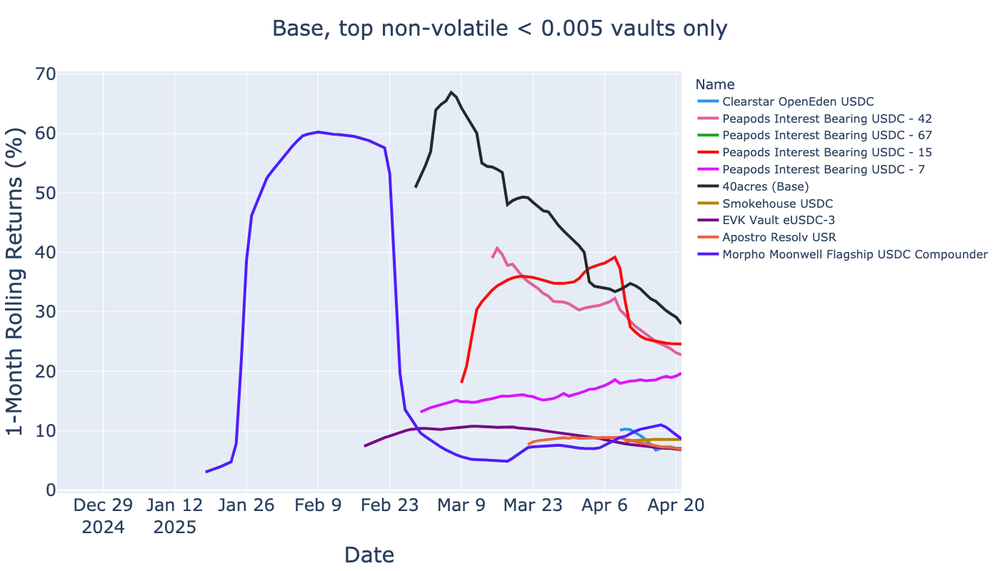

### Avalanche

Avalanche: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Staked avUSD,8.51%,3.52%,7.48%,0.00,"29,939,720.37","29,939,720.37",0.42,unknown,unknown,962.0,<unknown ERC-4626>,43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e,3.11%,2025-01-24,2025-04-21
EVK Vault eAUSD-2,6.24%,0.18%,6.24%,0.00,"49,928,735.09","49,466,261.96",0.03,unknown,unknown,"1,655.0",Euler Vault Kit,43114-0x2137568666f12fc5a026f5430ae7194f1c1362ab,0.18%,2025-04-10,2025-04-21
Staked deUSD (Avalanche) #2643,4.33%,1.07%,4.33%,0.00,"199,274.64","199,274.64",0.25,unknown,unknown,354.0,<unknown ERC-4626>,43114-0x68088c91446c7bea49ea7dbd3b96ce62b272dc96,1.07%,2025-01-24,2025-04-21
Wrapped Aave Avalanche AUSD,3.74%,0.10%,3.74%,0.00,"2,539,871.28","2,420,599.41",0.03,unknown,unknown,463.0,<unknown ERC-4626>,43114-0x45cf39eeb437fa95bb9b52c0105254a6bd25d01e,0.10%,2025-04-11,2025-04-21
EVK Vault eUSDt-3,3.73%,0.11%,3.73%,0.00,"14,999,963.48","14,999,963.48",0.03,unknown,unknown,847.0,Euler Vault Kit,43114-0xa446938b0204aa4055cdfed68ddf0e0d1bab3e9e,0.11%,2025-04-10,2025-04-21


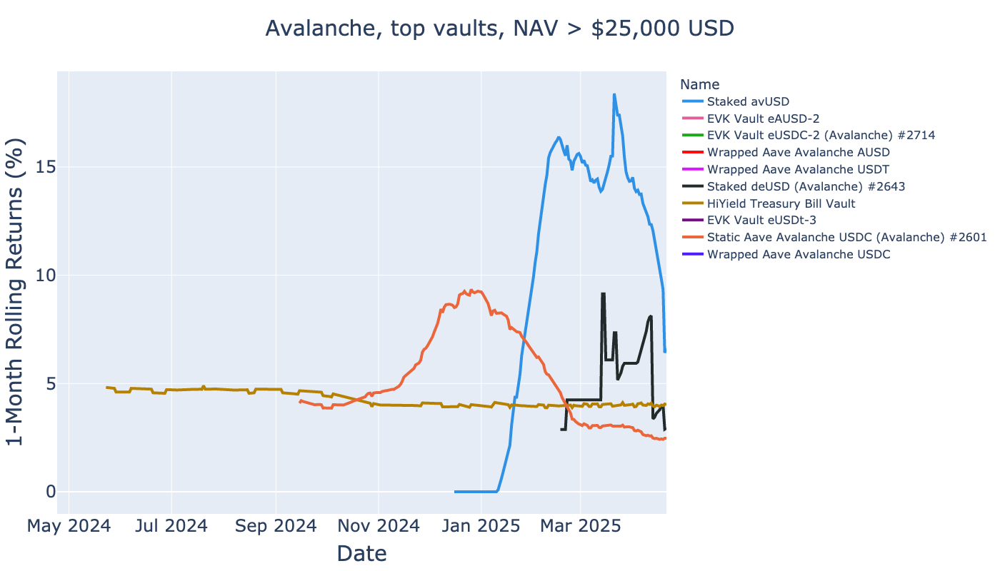

Avalanche: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Staked avUSD,8.51%,3.52%,7.48%,0.00,"29,939,720.37","29,939,720.37",0.42,unknown,unknown,962.0,<unknown ERC-4626>,43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e,3.11%,2025-01-24,2025-04-21
EVK Vault eAUSD-2,6.24%,0.18%,6.24%,0.00,"49,928,735.09","49,466,261.96",0.03,unknown,unknown,"1,655.0",Euler Vault Kit,43114-0x2137568666f12fc5a026f5430ae7194f1c1362ab,0.18%,2025-04-10,2025-04-21
Staked deUSD (Avalanche) #2643,4.33%,1.07%,4.33%,0.00,"199,274.64","199,274.64",0.25,unknown,unknown,354.0,<unknown ERC-4626>,43114-0x68088c91446c7bea49ea7dbd3b96ce62b272dc96,1.07%,2025-01-24,2025-04-21
Wrapped Aave Avalanche AUSD,3.74%,0.10%,3.74%,0.00,"2,539,871.28","2,420,599.41",0.03,unknown,unknown,463.0,<unknown ERC-4626>,43114-0x45cf39eeb437fa95bb9b52c0105254a6bd25d01e,0.10%,2025-04-11,2025-04-21
EVK Vault eUSDt-3,3.73%,0.11%,3.73%,0.00,"14,999,963.48","14,999,963.48",0.03,unknown,unknown,847.0,Euler Vault Kit,43114-0xa446938b0204aa4055cdfed68ddf0e0d1bab3e9e,0.11%,2025-04-10,2025-04-21


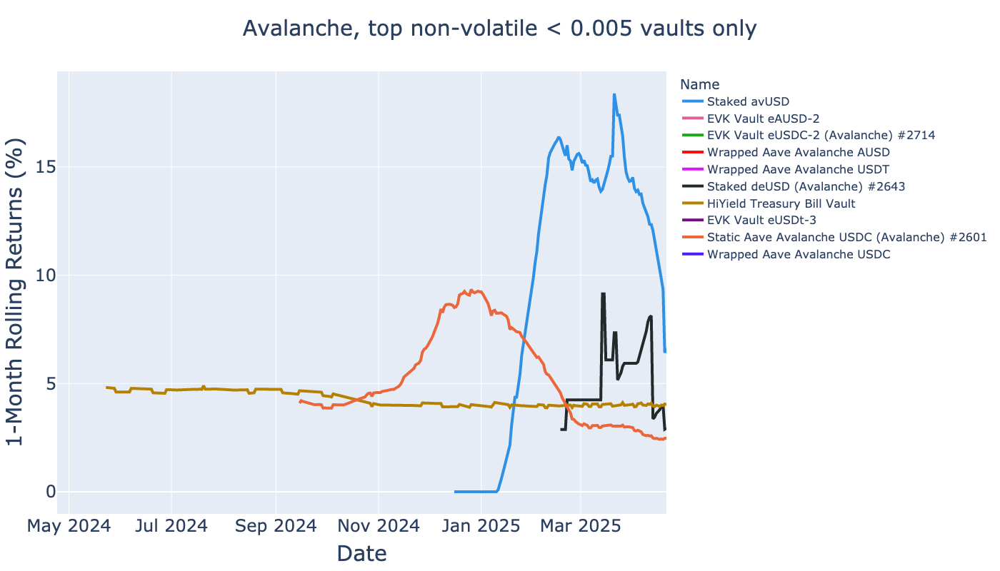

### Polygon

Polygon: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Gains Network USDC (Polygon) #2421,76.93%,104.52%,19.84%,0.03,"1,040,536.58","691,187.19",1.25,unknown,unknown,678.0,<unknown ERC-4626>,137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81,25.48%,2025-01-24,2025-04-21
Morpho Compound USDC Compounder,7.23%,0.44%,7.23%,0.00,"231,512.28","231,512.28",0.06,unknown,unknown,104.0,<unknown ERC-4626>,137-0x6e9ac188dbcc14632a253aa9ce2783cd712ab3ca,0.44%,2025-03-29,2025-04-21
Savings GYD (Polygon) #2492,13.64%,5.95%,6.40%,0.00,"82,352.29","61,419.43",0.45,unknown,unknown,58.0,<unknown ERC-4626>,137-0xea50f402653c41cadbafd1f788341db7b7f37816,2.84%,2025-01-24,2025-04-21
Gains Network DAI (Polygon) #2213,26.00%,71.87%,5.46%,0.01,"16,593,555.19","927,674.76",2.34,unknown,unknown,"21,651.0",<unknown ERC-4626>,137-0x91993f2101cc758d0deb7279d41e880f7defe827,13.26%,2025-01-24,2025-04-21
FARM_USDC (Polygon) #2522,4.69%,0.39%,4.69%,0.00,"63,231.33","63,231.33",0.08,unknown,unknown,26.0,Harvest Finance,137-0x8c88e410d75e4d7aef470c95f83fe4d70643073e,0.39%,2025-03-21,2025-04-21


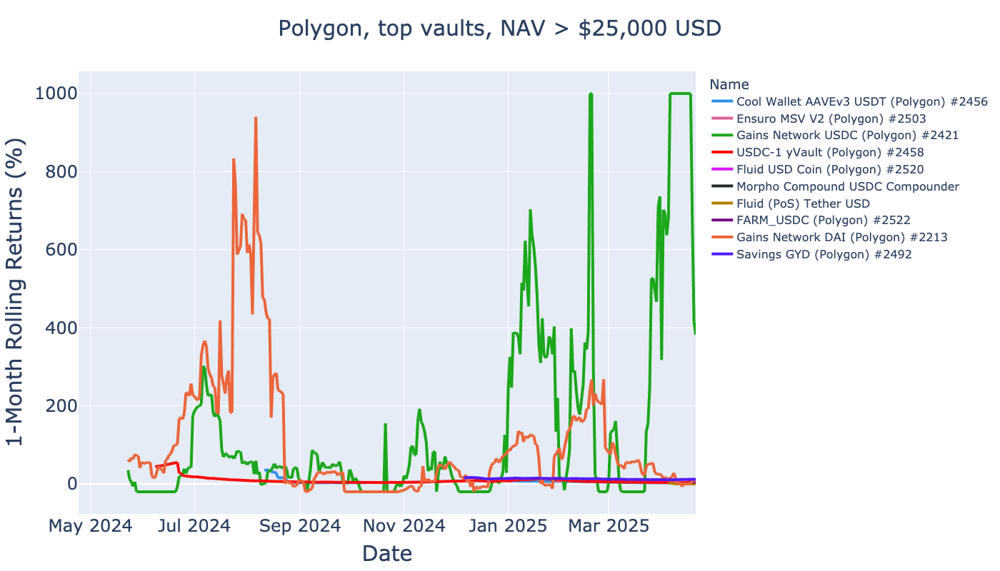

Polygon: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Morpho Compound USDC Compounder,7.23%,0.44%,7.23%,0.00,"231,512.28","231,512.28",0.06,unknown,unknown,104.0,<unknown ERC-4626>,137-0x6e9ac188dbcc14632a253aa9ce2783cd712ab3ca,0.44%,2025-03-29,2025-04-21
Savings GYD (Polygon) #2492,13.64%,5.95%,6.40%,0.00,"82,352.29","61,419.43",0.45,unknown,unknown,58.0,<unknown ERC-4626>,137-0xea50f402653c41cadbafd1f788341db7b7f37816,2.84%,2025-01-24,2025-04-21
FARM_USDC (Polygon) #2522,4.69%,0.39%,4.69%,0.00,"63,231.33","63,231.33",0.08,unknown,unknown,26.0,Harvest Finance,137-0x8c88e410d75e4d7aef470c95f83fe4d70643073e,0.39%,2025-03-21,2025-04-21
Ensuro MSV V2 (Polygon) #2503,5.21%,1.56%,3.61%,0.00,"1,329,197.99","1,329,197.99",0.30,unknown,unknown,"1,047.0",<unknown ERC-4626>,137-0x14f6dfee761455247c6bf2b2b052a1f6245dd6fb,1.08%,2025-01-24,2025-04-21
Fluid USD Coin (Polygon) #2520,1.66%,0.20%,1.66%,0.00,"15,213,384.60","14,721,929.29",0.12,unknown,unknown,"1,218.0",Fluid,137-0x571d456b578fdc34e26e6d636736ed7c0cdb9d89,0.20%,2025-03-07,2025-04-21


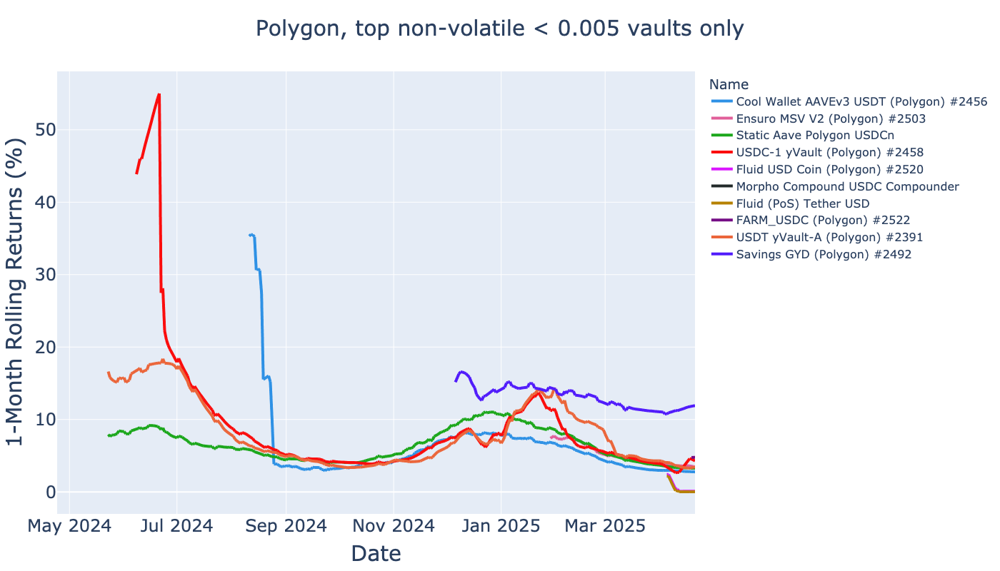

### ZKsync

ZKsync: Displaying top 5 vaults based on three months returns, total 4 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
FARM_USDC.e (ZKsync) #2810,684.80%,68.03%,685.53%,0.03,"94,421.99","32,601.88",0.25,unknown,unknown,33.0,Harvest Finance,324-0x6047987b668804506133887db55eeb0a709c73c4,68.06%,2025-01-24,2025-04-20
FARM_USDC.e,38.94%,31.13%,13.39%,0.00,"62,224.41","60,815.60",0.82,unknown,unknown,27.0,Harvest Finance,324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26,10.91%,2025-01-24,2025-04-20
Wrapped Mountain Protocol USD (ZKsync) #2793,17.07%,7.56%,2.22%,0.00,"6,853,574.48","219,601.37",0.46,unknown,unknown,773.0,<unknown ERC-4626>,324-0xa900cbe7739c96d2b153a273953620a701d5442b,1.02%,2025-01-24,2025-04-20
hsUSDC,12.36%,25.03%,1.97%,0.00,"3,991,529.01","736,998.15",1.92,unknown,unknown,"48,708.0",<unknown ERC-4626>,324-0xaf08a9d918f16332f22cf8dc9abe9d9e14ddcbc2,3.81%,2025-01-24,2025-04-20


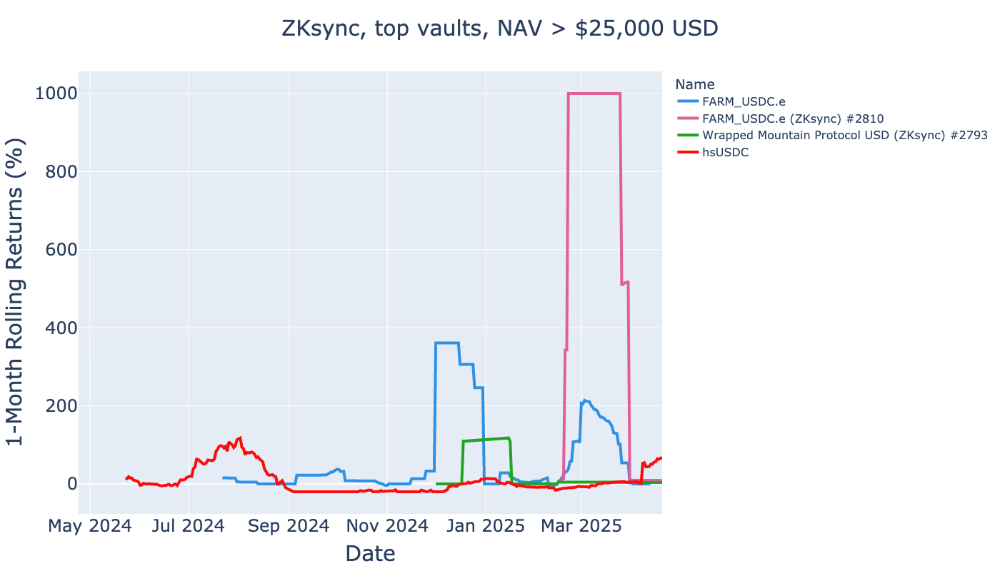

ZKsync: Displaying top 5 non-volatile vaults based on three months returns, total 4 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
FARM_USDC.e,38.94%,31.13%,13.39%,0.00,"62,224.41","60,815.60",0.82,unknown,unknown,27.0,Harvest Finance,324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26,10.91%,2025-01-24,2025-04-20
Wrapped Mountain Protocol USD (ZKsync) #2793,17.07%,7.56%,2.22%,0.00,"6,853,574.48","219,601.37",0.46,unknown,unknown,773.0,<unknown ERC-4626>,324-0xa900cbe7739c96d2b153a273953620a701d5442b,1.02%,2025-01-24,2025-04-20
hsUSDC,12.36%,25.03%,1.97%,0.00,"3,991,529.01","736,998.15",1.92,unknown,unknown,"48,708.0",<unknown ERC-4626>,324-0xaf08a9d918f16332f22cf8dc9abe9d9e14ddcbc2,3.81%,2025-01-24,2025-04-20


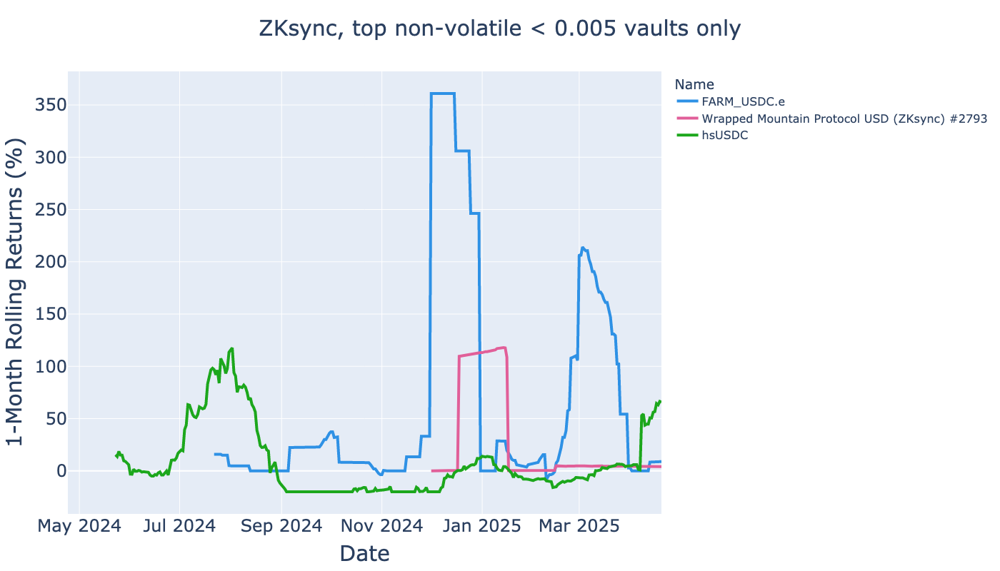

### Gnosis

Gnosis: Displaying top 5 vaults based on three months returns, total 5 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Savings GYD (Gnosis) #2787,9.70%,4.38%,5.95%,0.00,"297,345.83","284,303.10",0.46,unknown,unknown,142.0,<unknown ERC-4626>,100-0xea50f402653c41cadbafd1f788341db7b7f37816,2.71%,2025-01-24,2025-04-21
Savings xDAI,10.77%,17.30%,1.31%,0.00,"87,049,009.16","71,886,249.92",1.56,unknown,unknown,"562,452.0",<unknown ERC-4626>,100-0xaf204776c7245bf4147c2612bf6e5972ee483701,2.05%,2025-01-24,2025-04-21
Static Aave Gnosis USDCe,2.82%,1.75%,1.13%,0.00,"591,994.90","318,391.67",0.62,unknown,unknown,"2,212.0",Superform,100-0xf0e7ec247b918311afa054e0aedb99d74c31b809,0.70%,2025-01-24,2025-04-21
Staked EURA (Gnosis) #2765,4.51%,7.46%,0.56%,0.00,"720,595.16","614,433.40",1.63,unknown,unknown,"3,602.0",<unknown ERC-4626>,100-0x004626a008b1acdc4c74ab51644093b155e59a23,0.91%,2025-01-24,2025-04-21
Prize WXDAI - DAI Savings Rate,-0.00%,-0.00%,-0.02%,0.00,"1,541,649.15","1,176,050.72",0.58,unknown,unknown,"1,640.0",<unknown ERC-4626>,100-0xbb7e99abccce01589ad464ff698ad139b0705d90,-0.01%,2025-01-24,2025-04-21


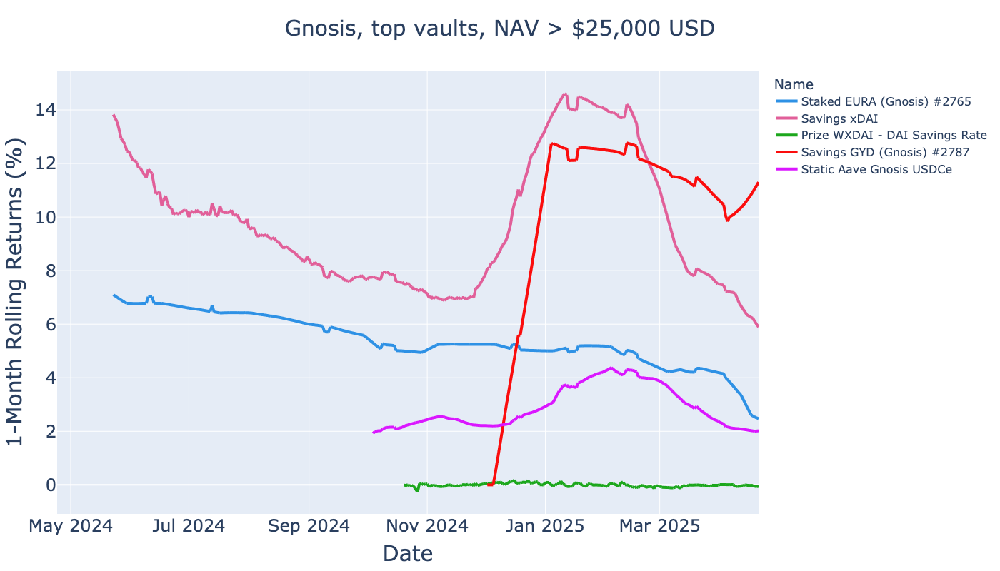

Gnosis: Displaying top 5 non-volatile vaults based on three months returns, total 5 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Savings GYD (Gnosis) #2787,9.70%,4.38%,5.95%,0.00,"297,345.83","284,303.10",0.46,unknown,unknown,142.0,<unknown ERC-4626>,100-0xea50f402653c41cadbafd1f788341db7b7f37816,2.71%,2025-01-24,2025-04-21
Savings xDAI,10.77%,17.30%,1.31%,0.00,"87,049,009.16","71,886,249.92",1.56,unknown,unknown,"562,452.0",<unknown ERC-4626>,100-0xaf204776c7245bf4147c2612bf6e5972ee483701,2.05%,2025-01-24,2025-04-21
Static Aave Gnosis USDCe,2.82%,1.75%,1.13%,0.00,"591,994.90","318,391.67",0.62,unknown,unknown,"2,212.0",Superform,100-0xf0e7ec247b918311afa054e0aedb99d74c31b809,0.70%,2025-01-24,2025-04-21
Staked EURA (Gnosis) #2765,4.51%,7.46%,0.56%,0.00,"720,595.16","614,433.40",1.63,unknown,unknown,"3,602.0",<unknown ERC-4626>,100-0x004626a008b1acdc4c74ab51644093b155e59a23,0.91%,2025-01-24,2025-04-21
Prize WXDAI - DAI Savings Rate,-0.00%,-0.00%,-0.02%,0.00,"1,541,649.15","1,176,050.72",0.58,unknown,unknown,"1,640.0",<unknown ERC-4626>,100-0xbb7e99abccce01589ad464ff698ad139b0705d90,-0.01%,2025-01-24,2025-04-21


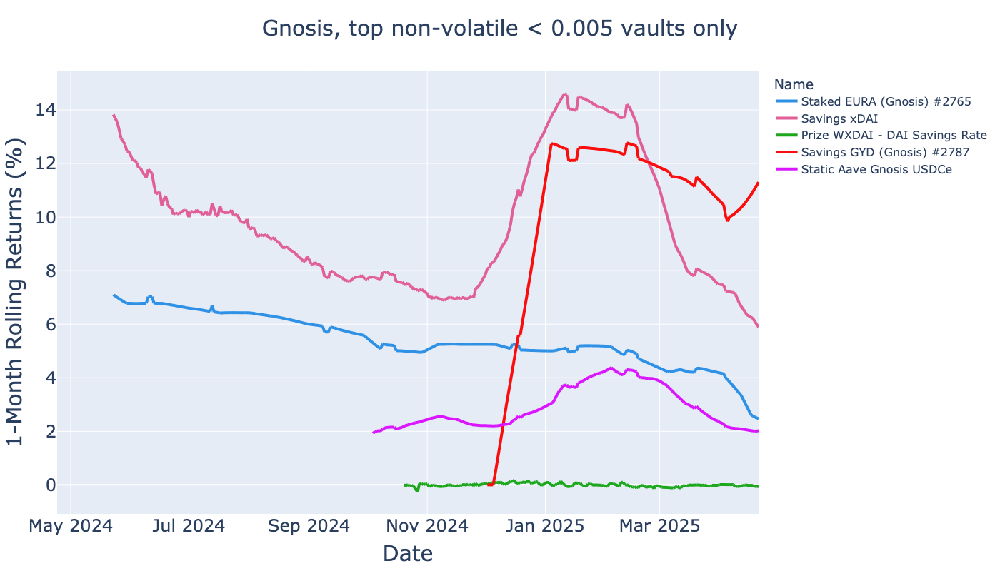

### Optimism

Optimism: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
40op-USDC-Vault,37.12%,4.96%,37.12%,0.00,"251,170.04","247,902.39",0.15,unknown,unknown,147.0,<unknown ERC-4626>,10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957,4.96%,2025-02-24,2025-04-21
Curve Vault for crvUSD (Optimism) #3088,10.32%,4.79%,3.65%,0.00,"104,984.32","104,984.32",0.48,unknown,unknown,62.0,<unknown ERC-4626>,10-0x05577790318929624b4613f5a7e3b73ab40e38de,1.72%,2025-01-24,2025-04-21
PoolTogether USDC winETH,-68.31%,-44.47%,2.07%,0.00,"3,144,851.97","417,566.37",0.51,unknown,unknown,"2,867.0",<unknown ERC-4626>,10-0x11271bf9855b679bc484a0c80a69d8cc72fcef89,1.06%,2025-01-24,2025-04-21
ERC4626-Wrapped Aave v3 USDC (Optimism) #3059,6.71%,3.38%,1.99%,0.00,"3,144,851.97","417,566.37",0.51,unknown,unknown,"2,905.0",<unknown ERC-4626>,10-0xe6d87294db6eccf91baeecef341be48ea004414a,1.02%,2025-01-24,2025-04-21
Aave V3 DAI Lender (Optimism) #3046,5.93%,4.07%,1.39%,0.00,"114,228.08","25,227.67",0.69,unknown,unknown,109.0,<unknown ERC-4626>,10-0x91e6c36992380017aecc91b0c21b0fbf4bb4fdd6,0.96%,2025-01-24,2025-04-21


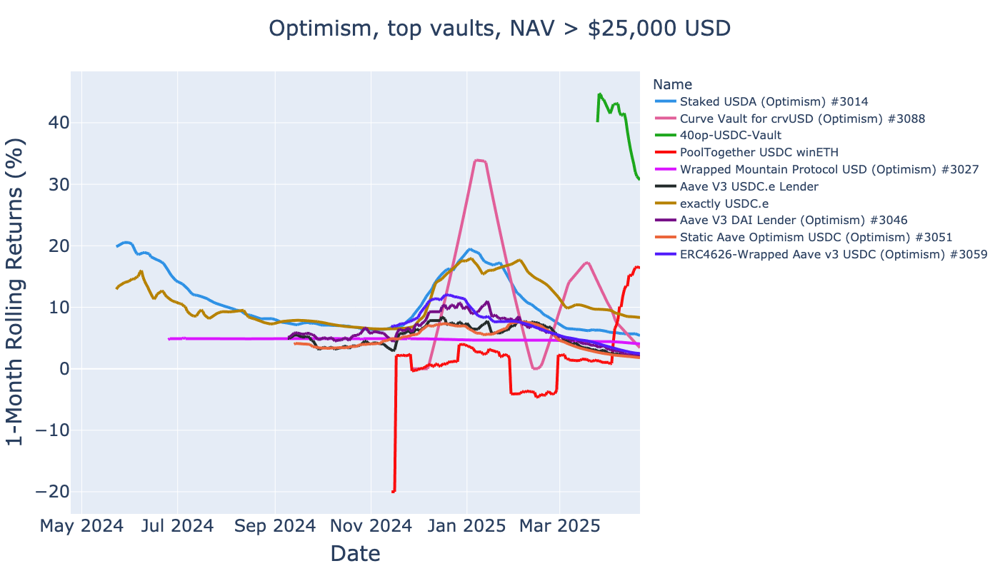

Optimism: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
40op-USDC-Vault,37.12%,4.96%,37.12%,0.00,"251,170.04","247,902.39",0.15,unknown,unknown,147.0,<unknown ERC-4626>,10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957,4.96%,2025-02-24,2025-04-21
Curve Vault for crvUSD (Optimism) #3088,10.32%,4.79%,3.65%,0.00,"104,984.32","104,984.32",0.48,unknown,unknown,62.0,<unknown ERC-4626>,10-0x05577790318929624b4613f5a7e3b73ab40e38de,1.72%,2025-01-24,2025-04-21
PoolTogether USDC winETH,-68.31%,-44.47%,2.07%,0.00,"3,144,851.97","417,566.37",0.51,unknown,unknown,"2,867.0",<unknown ERC-4626>,10-0x11271bf9855b679bc484a0c80a69d8cc72fcef89,1.06%,2025-01-24,2025-04-21
ERC4626-Wrapped Aave v3 USDC (Optimism) #3059,6.71%,3.38%,1.99%,0.00,"3,144,851.97","417,566.37",0.51,unknown,unknown,"2,905.0",<unknown ERC-4626>,10-0xe6d87294db6eccf91baeecef341be48ea004414a,1.02%,2025-01-24,2025-04-21
Aave V3 DAI Lender (Optimism) #3046,5.93%,4.07%,1.39%,0.00,"114,228.08","25,227.67",0.69,unknown,unknown,109.0,<unknown ERC-4626>,10-0x91e6c36992380017aecc91b0c21b0fbf4bb4fdd6,0.96%,2025-01-24,2025-04-21


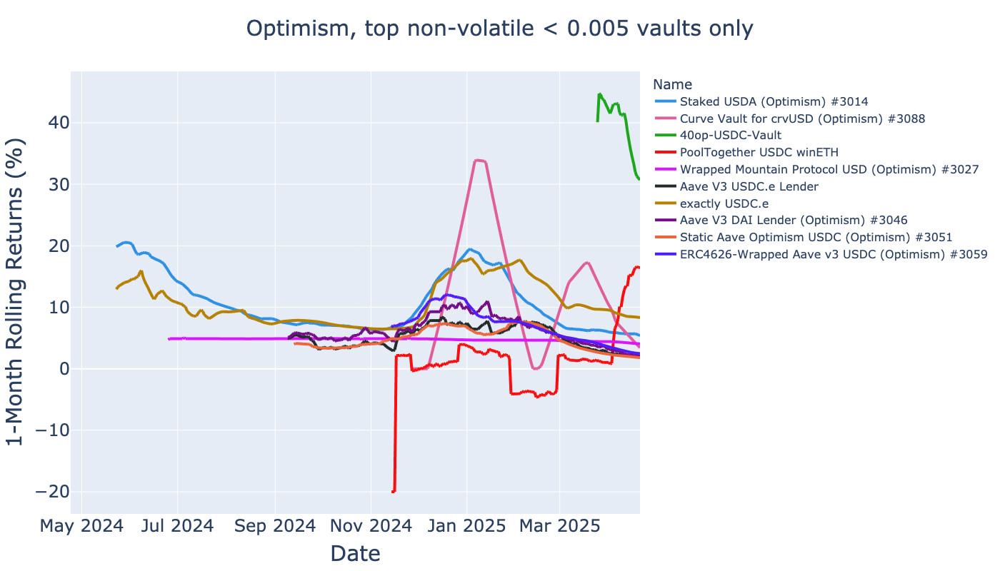

### Binance

Binance: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
kBOX,46.27%,10.63%,47.24%,0.01,"6,119,183.47","5,873,845.01",0.27,unknown,unknown,50.0,<unknown ERC-4626>,56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813,10.82%,2025-01-24,2025-04-21
kREX,12.03%,3.64%,8.20%,0.00,"3,288,200.50","3,197,713.03",0.31,unknown,unknown,31.0,<unknown ERC-4626>,56-0xa40e085d0584eed39daaa077fcc4cd153ae9a5b0,2.51%,2025-01-24,2025-04-21
EVK Vault eUSDT-2 (Binance) #3151,5.38%,0.06%,5.38%,0.00,"25,455.00","25,455.00",0.01,unknown,unknown,35.0,Euler Vault Kit,56-0x6078b5de9d10587cb466ecbbf55c95898afe99c2,0.06%,2025-04-17,2025-04-21
EVK Vault eUSDC-3 (Binance) #3150,4.20%,0.06%,4.20%,0.00,"911,559.74","736,720.38",0.01,unknown,unknown,113.0,Euler Vault Kit,56-0xa9ca5c4bff689afcfb249ae81565422fa78f82b4,0.06%,2025-04-16,2025-04-21
EVK Vault eUSDT-3 (Binance) #3153,3.00%,0.04%,3.00%,0.00,"1,614,865.28","1,469,603.08",0.01,unknown,unknown,189.0,Euler Vault Kit,56-0x5fd02479f938929f6b9fe1b7af6430cfd4afa6aa,0.04%,2025-04-16,2025-04-21


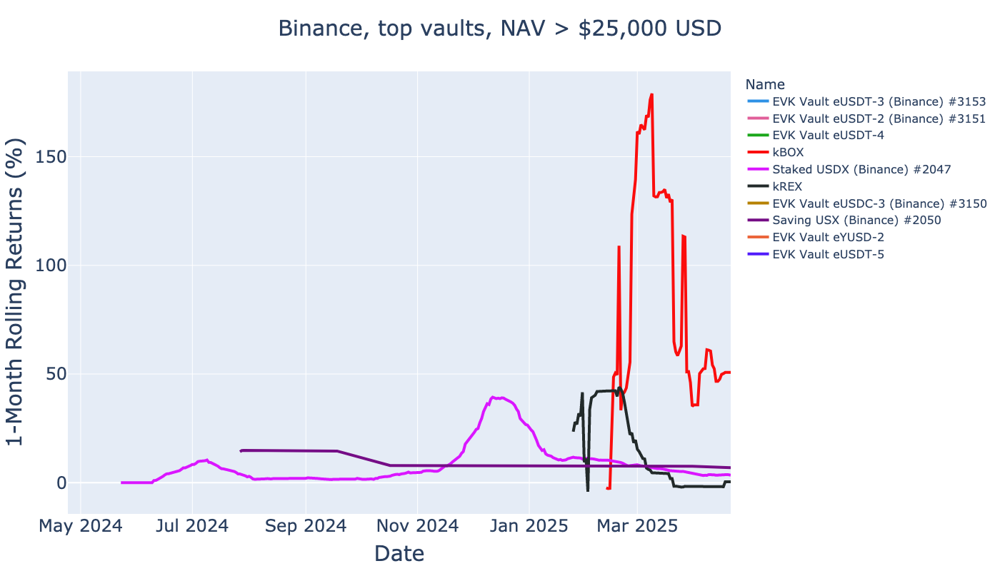

Binance: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
kREX,12.03%,3.64%,8.20%,0.00,"3,288,200.50","3,197,713.03",0.31,unknown,unknown,31.0,<unknown ERC-4626>,56-0xa40e085d0584eed39daaa077fcc4cd153ae9a5b0,2.51%,2025-01-24,2025-04-21
EVK Vault eUSDT-2 (Binance) #3151,5.38%,0.06%,5.38%,0.00,"25,455.00","25,455.00",0.01,unknown,unknown,35.0,Euler Vault Kit,56-0x6078b5de9d10587cb466ecbbf55c95898afe99c2,0.06%,2025-04-17,2025-04-21
EVK Vault eUSDC-3 (Binance) #3150,4.20%,0.06%,4.20%,0.00,"911,559.74","736,720.38",0.01,unknown,unknown,113.0,Euler Vault Kit,56-0xa9ca5c4bff689afcfb249ae81565422fa78f82b4,0.06%,2025-04-16,2025-04-21
EVK Vault eUSDT-3 (Binance) #3153,3.00%,0.04%,3.00%,0.00,"1,614,865.28","1,469,603.08",0.01,unknown,unknown,189.0,Euler Vault Kit,56-0x5fd02479f938929f6b9fe1b7af6430cfd4afa6aa,0.04%,2025-04-16,2025-04-21
EVK Vault eYUSD-2,2.60%,0.01%,2.60%,0.00,"1,401,865.45","1,401,865.45",0.01,unknown,unknown,85.0,Euler Vault Kit,56-0xc4db46b082b415c16c54c91c5750df8e2f90ef36,0.01%,2025-04-19,2025-04-21


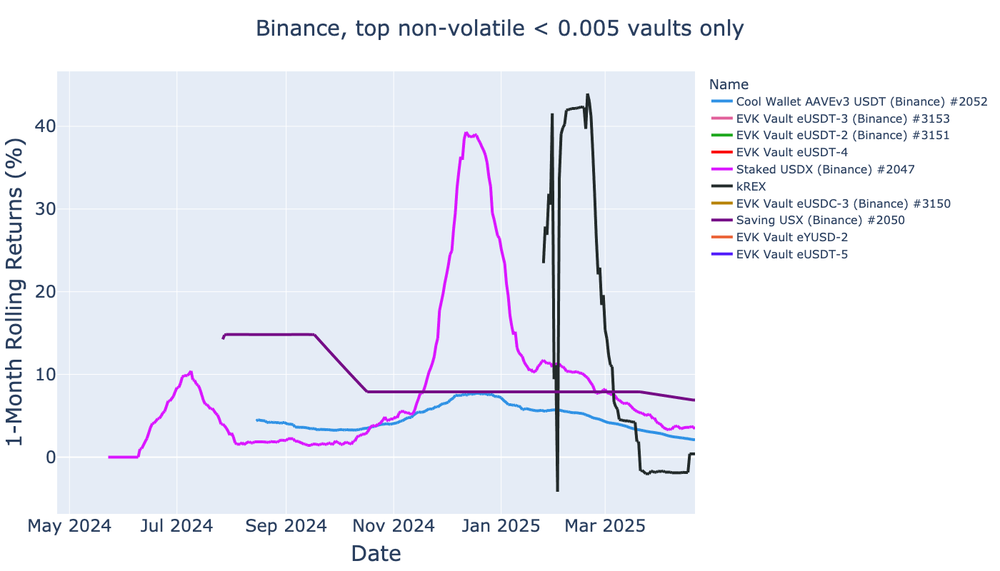

### Blast

Blast: Displaying top 5 vaults based on three months returns, total 4 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Wasabi USDB Vault,12.75%,14.50%,2.20%,0.00,"53,857,471.56","1,499,310.67",1.13,unknown,unknown,"92,849.0",<unknown ERC-4626>,81457-0x4bed2a922654cacc2be974689619768fabf24855,2.48%,2025-01-24,2025-04-21
Hyper USDB,8.50%,9.10%,1.49%,0.00,"5,122,939.24","386,498.32",1.07,unknown,unknown,"39,629.0",<unknown ERC-4626>,81457-0x390b781baf1e6db546cf4e3354b81446947838d2,1.60%,2025-01-24,2025-04-21
ybUSDB (Blast) #2741,8.66%,9.92%,1.40%,0.00,"1,740,737.67","75,270.91",1.14,unknown,unknown,"21,902.0",<unknown ERC-4626>,81457-0xcd732d21c1b23a3f84bb386e9759b5b6a1bcbe39,1.60%,2025-01-24,2025-04-21
Vault Tranche USDB,-4.57%,-5.09%,0.00%,0.00,"14,291,856.49","37,728.20",1.12,unknown,unknown,"42,998.0",Gains Network,81457-0xdb0c5d39c95a53ecda3fcf6f6c5c81c7a74910c7,0.00%,2025-01-24,2025-04-21


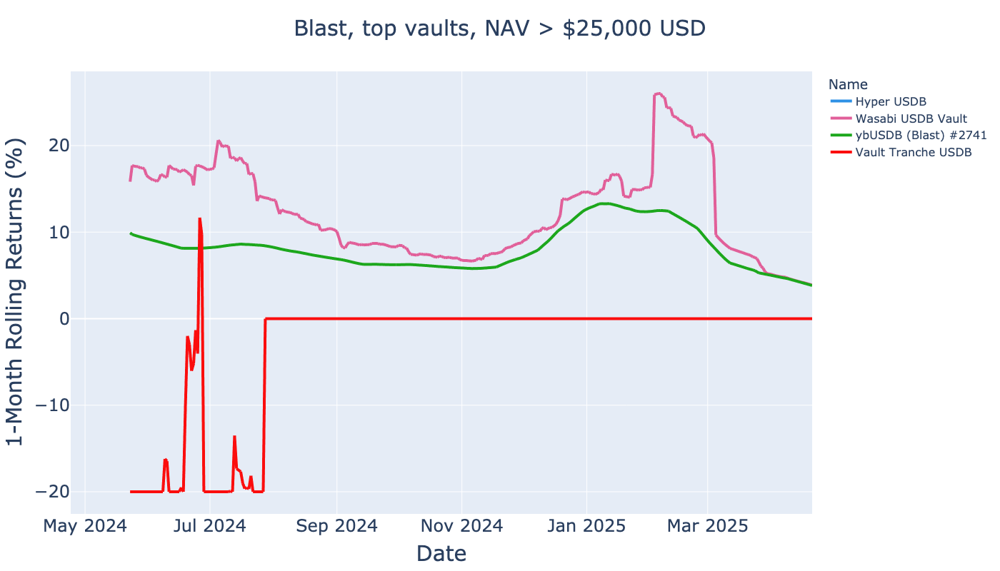

Blast: Displaying top 5 non-volatile vaults based on three months returns, total 4 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Wasabi USDB Vault,12.75%,14.50%,2.20%,0.00,"53,857,471.56","1,499,310.67",1.13,unknown,unknown,"92,849.0",<unknown ERC-4626>,81457-0x4bed2a922654cacc2be974689619768fabf24855,2.48%,2025-01-24,2025-04-21
Hyper USDB,8.50%,9.10%,1.49%,0.00,"5,122,939.24","386,498.32",1.07,unknown,unknown,"39,629.0",<unknown ERC-4626>,81457-0x390b781baf1e6db546cf4e3354b81446947838d2,1.60%,2025-01-24,2025-04-21
ybUSDB (Blast) #2741,8.66%,9.92%,1.40%,0.00,"1,740,737.67","75,270.91",1.14,unknown,unknown,"21,902.0",<unknown ERC-4626>,81457-0xcd732d21c1b23a3f84bb386e9759b5b6a1bcbe39,1.60%,2025-01-24,2025-04-21
Vault Tranche USDB,-4.57%,-5.09%,0.00%,0.00,"14,291,856.49","37,728.20",1.12,unknown,unknown,"42,998.0",Gains Network,81457-0xdb0c5d39c95a53ecda3fcf6f6c5c81c7a74910c7,0.00%,2025-01-24,2025-04-21


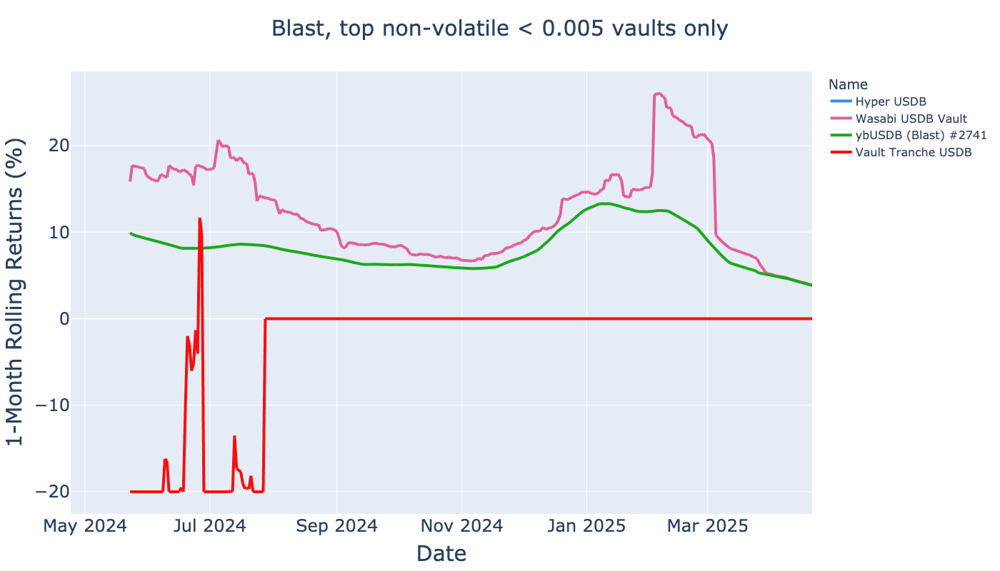

### Mantle

Mantle: Displaying top 5 vaults based on three months returns, total 0 interesting vaults on this chain
No vaults to display: Mantle, top vaults, NAV > $25,000 USD
Mantle: Displaying top 5 non-volatile vaults based on three months returns, total 0 interesting vaults on this chain
No vaults to display: Mantle, top non-volatile < 0.005 vaults only


### Berachain

Berachain: Displaying top 5 vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Lend USDC on Dahlia WBERA/USDC (68% LLTV),13.08%,2.45%,13.08%,0.00,"53,677.82","37,820.27",0.20,unknown,unknown,90.0,<unknown ERC-4626>,80094-0x09ebbb385487dc297dbdc5c1cc7befd40a3e3e89,2.45%,2025-02-07,2025-04-20
EVK Vault eUSDe-1,7.76%,0.45%,7.76%,0.00,"480,881.04","34,703.69",0.06,unknown,unknown,387.0,Euler Vault Kit,80094-0x558b16e07b8558b2a54946ca973b7b20b86a8b87,0.45%,2025-03-29,2025-04-20
EVK Vault eUSDC.e-2,6.96%,0.59%,6.96%,0.00,"5,398,319.00","717,046.57",0.09,unknown,unknown,"1,260.0",Euler Vault Kit,80094-0x66f233ac844c3948a516857ca769872e5941f91c,0.59%,2025-03-19,2025-04-20
EVK Vault eUSDC.e-1,4.89%,0.42%,4.89%,0.00,"6,852,074.66","756,398.95",0.09,unknown,unknown,"1,518.0",Euler Vault Kit,80094-0x1371dd58ce95ecd624340f072f97212a2661a280,0.42%,2025-03-19,2025-04-20
EVK Vault eUSDC.e-3,4.85%,0.42%,4.85%,0.00,"5,472,974.66","3,840,484.81",0.09,unknown,unknown,771.0,Euler Vault Kit,80094-0xe932da5a4d00536c224f8153f299cdcd8054c444,0.42%,2025-03-19,2025-04-20


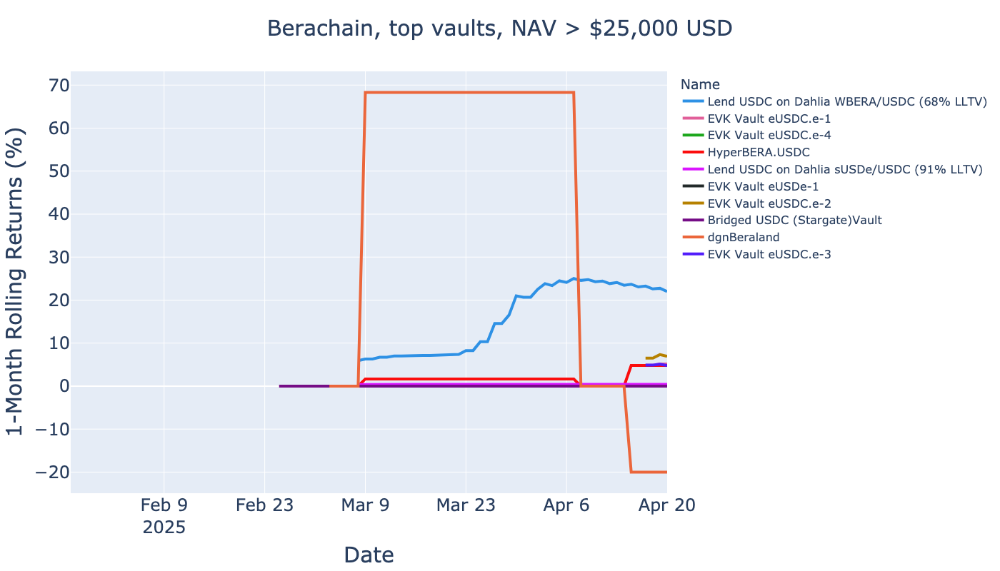

Berachain: Displaying top 5 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Lend USDC on Dahlia WBERA/USDC (68% LLTV),13.08%,2.45%,13.08%,0.00,"53,677.82","37,820.27",0.20,unknown,unknown,90.0,<unknown ERC-4626>,80094-0x09ebbb385487dc297dbdc5c1cc7befd40a3e3e89,2.45%,2025-02-07,2025-04-20
EVK Vault eUSDe-1,7.76%,0.45%,7.76%,0.00,"480,881.04","34,703.69",0.06,unknown,unknown,387.0,Euler Vault Kit,80094-0x558b16e07b8558b2a54946ca973b7b20b86a8b87,0.45%,2025-03-29,2025-04-20
EVK Vault eUSDC.e-2,6.96%,0.59%,6.96%,0.00,"5,398,319.00","717,046.57",0.09,unknown,unknown,"1,260.0",Euler Vault Kit,80094-0x66f233ac844c3948a516857ca769872e5941f91c,0.59%,2025-03-19,2025-04-20
EVK Vault eUSDC.e-1,4.89%,0.42%,4.89%,0.00,"6,852,074.66","756,398.95",0.09,unknown,unknown,"1,518.0",Euler Vault Kit,80094-0x1371dd58ce95ecd624340f072f97212a2661a280,0.42%,2025-03-19,2025-04-20
EVK Vault eUSDC.e-3,4.85%,0.42%,4.85%,0.00,"5,472,974.66","3,840,484.81",0.09,unknown,unknown,771.0,Euler Vault Kit,80094-0xe932da5a4d00536c224f8153f299cdcd8054c444,0.42%,2025-03-19,2025-04-20


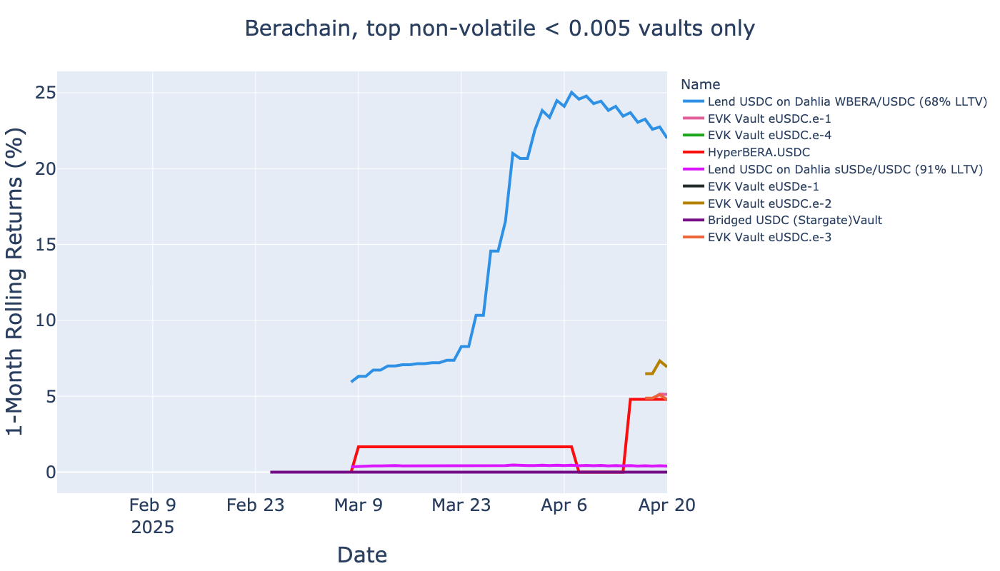

### Mode

Mode: Displaying top 5 vaults based on three months returns, total 2 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
USDT Ironclad Vault (Mode) #1961,0.00%,0.00%,0.00%,0.00,"148,025.55","111,020.54",0.67,unknown,unknown,31.0,<unknown ERC-4626>,34443-0xc9cfb5221ee50098bd8882727522301a62c7b021,0.00%,2025-01-24,2025-04-20
USDC Ironclad Vault,0.00%,0.00%,0.00%,0.00,"599,423.34","337,647.27",0.67,unknown,unknown,183.0,<unknown ERC-4626>,34443-0x882fd369341fc435ad5e54e91d1ebc23b1fc6d4c,0.00%,2025-01-24,2025-04-20


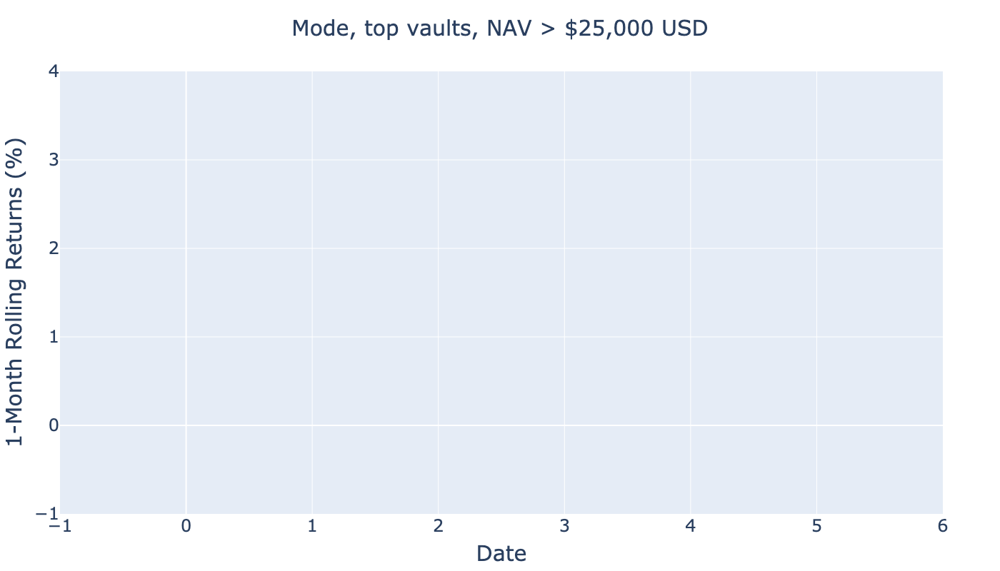

Mode: Displaying top 5 non-volatile vaults based on three months returns, total 2 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
USDT Ironclad Vault (Mode) #1961,0.00%,0.00%,0.00%,0.00,"148,025.55","111,020.54",0.67,unknown,unknown,31.0,<unknown ERC-4626>,34443-0xc9cfb5221ee50098bd8882727522301a62c7b021,0.00%,2025-01-24,2025-04-20
USDC Ironclad Vault,0.00%,0.00%,0.00%,0.00,"599,423.34","337,647.27",0.67,unknown,unknown,183.0,<unknown ERC-4626>,34443-0x882fd369341fc435ad5e54e91d1ebc23b1fc6d4c,0.00%,2025-01-24,2025-04-20


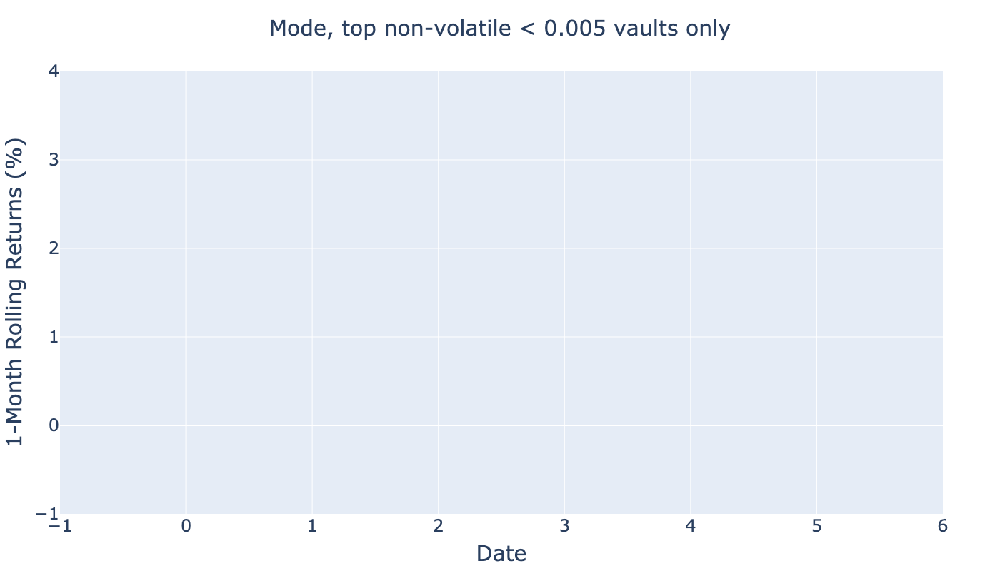

### Celo

Celo: Displaying top 5 vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Staked EURA (Celo) #2817,3.83%,6.34%,0.58%,0.00,"3,191,244.29","3,191,244.29",1.63,unknown,unknown,223.0,<unknown ERC-4626>,42220-0x004626a008b1acdc4c74ab51644093b155e59a23,0.95%,2025-01-24,2025-04-21


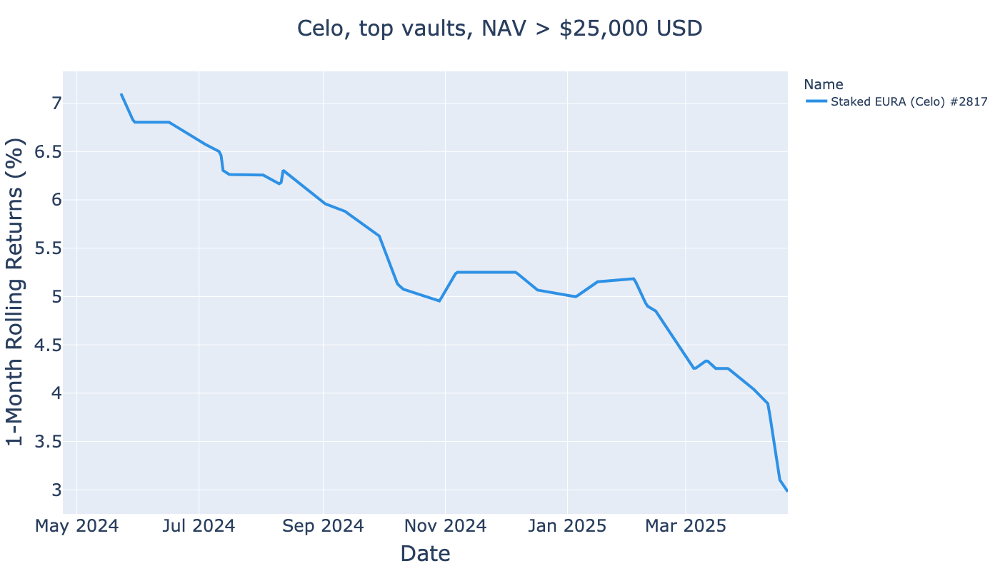

Celo: Displaying top 5 non-volatile vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
Staked EURA (Celo) #2817,3.83%,6.34%,0.58%,0.00,"3,191,244.29","3,191,244.29",1.63,unknown,unknown,223.0,<unknown ERC-4626>,42220-0x004626a008b1acdc4c74ab51644093b155e59a23,0.95%,2025-01-24,2025-04-21


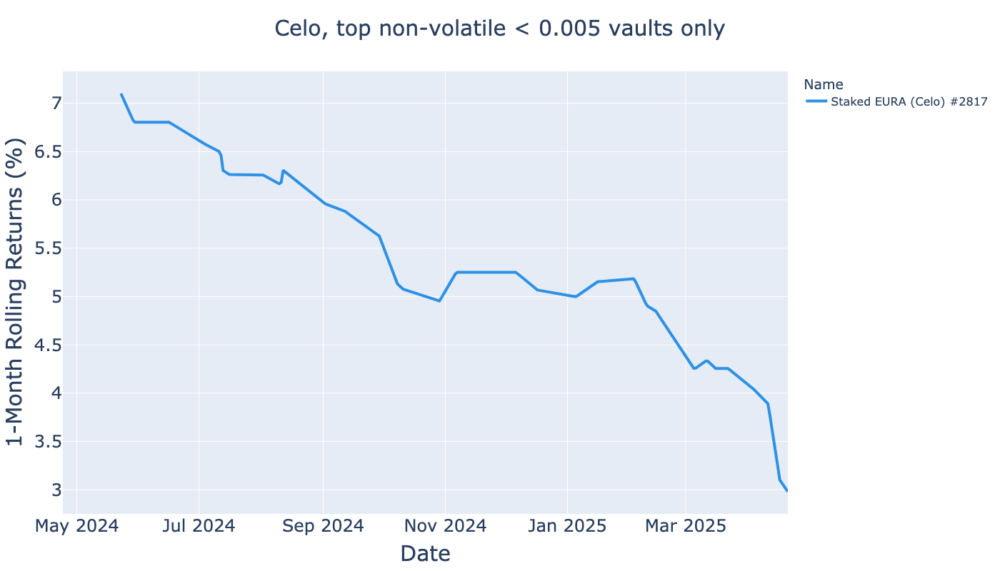

### Soneium

Soneium: Displaying top 5 vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
UB-USDC,0.14%,0.04%,0.14%,0.00,"1,466,682.67","1,189,033.07",0.27,unknown,unknown,"229,127.0",<unknown ERC-4626>,1868-0xc675bb95d73ca7db2c09c3dc04daaa7944ccba41,0.04%,2025-01-24,2025-04-21


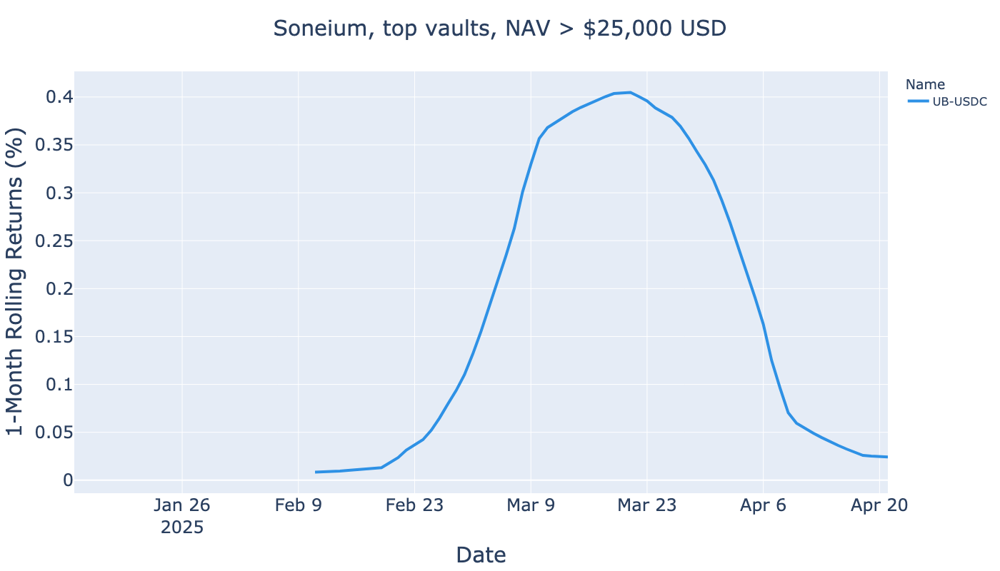

Soneium: Displaying top 5 non-volatile vaults based on three months returns, total 1 interesting vaults on this chain


,Annualised return,Lifetime return,Last 3M return,3M months volatility,Peak TVL USD,Current TVL USD,Age (years),Management fee,perf_fee,Deposit/redeem count,Protocol,id,Last 3M return,First deposit,Last deposit
name,,,,,,,,,,,,,,,
UB-USDC,0.14%,0.04%,0.14%,0.00,"1,466,682.67","1,189,033.07",0.27,unknown,unknown,"229,127.0",<unknown ERC-4626>,1868-0xc675bb95d73ca7db2c09c3dc04daaa7944ccba41,0.04%,2025-01-24,2025-04-21


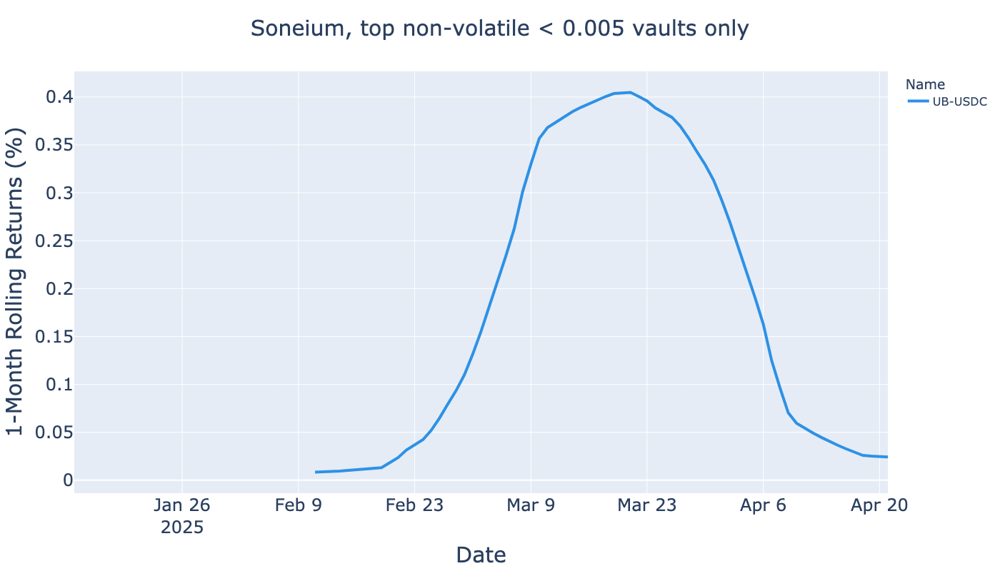

In [15]:
from IPython.display import Markdown

benchmark_count = 10
min_nav = 25_000
volatility_threshold = 0.005

def _draw_chain_top_vaults_chart(interesting_vaults: pd.Series, title: str):
    """Draw 1 months return chart for specific vaults"""
    df = calculate_rolling_returns(
        returns_df, 
        interesting_vaults=interesting_vaults, 
        clip_up=1000,
        clip_down=-20,
        )

    # Remove entries with all zero returns.
    # TODO: Get rid of Hyped USDB and others with zero returns still showing up in the charts
    mask = df.groupby('name')['daily_returns'].transform(lambda x: (x != 0).any())
    filtered_returns_df = df[mask]
    
    if len(df) == 0:
        print(f"No vaults to display: {title}")
        return

    # 
    
    fig = px.line(filtered_returns_df, 
                  x='timestamp', 
                  y='rolling_1m_returns_annualized',
                  color='name',
                  title=title, 
                  labels={'rolling_1m_returns': '1-Month Rolling Returns (%)',
                         'timestamp': 'Date',
                         'name': 'Name'},
                  hover_data=['id'],
                  color_discrete_sequence=qualitative.Dark24,
                  )

    fig.update_layout(
        xaxis_title='Date',
        yaxis_title='1-Month Rolling Returns (%)',
        legend_title='Name',
        hovermode='closest',
        template=pio.templates.default,
    )
    fig.update_traces(line=dict(width=4))
    fig.show()    

# Do 2 charts per chain
for chain_name in lifetime_data_df["chain"].unique():

    display(Markdown(f"### {chain_name}"))
    
    # chain_df = df[df["chain"] == chain_id]
    lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df['chain'] == chain_name]
    
    lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["current_nav"] >= min_nav]
    lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by='three_months_cagr', ascending=False)
 
    lifetime_data_filtered_slice_df = lifetime_data_filtered_df[0:benchmark_count]
    interesting_vaults = lifetime_data_filtered_slice_df["id"]
    # Cut off chart at 1000x returns

    # Rearrange columns
    column_to_shift = "three_months_cagr"
    new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
    lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

    print(f"{chain_name}: Displaying top 5 vaults based on three months returns, total {len(interesting_vaults)} interesting vaults on this chain")
    lifetime_data_filtered_slice_df = lifetime_data_filtered_slice_df.drop(columns=["chain", "denomination"])
    if len(lifetime_data_filtered_slice_df) > 0:
        display(format_lifetime_table(lifetime_data_filtered_slice_df[0:5]))

    _draw_chain_top_vaults_chart(interesting_vaults, title=f'{chain_name}, top vaults, NAV > ${min_nav:,} USD',)
   

    #
    # Non-volatile
    # 

    print(f"{chain_name}: Displaying top 5 non-volatile vaults based on three months returns, total {len(interesting_vaults)} interesting vaults on this chain")
    lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["three_months_volatility"] < 0.005]
    lifetime_data_filtered_slice_df = lifetime_data_filtered_slice_df[lifetime_data_filtered_slice_df["three_months_volatility"] < 0.005]
    if len(lifetime_data_filtered_slice_df) > 0:
        display(format_lifetime_table(lifetime_data_filtered_slice_df[0:5]))
    
    lifetime_data_filtered_slice_df = lifetime_data_filtered_df[0:benchmark_count]
    interesting_vaults = lifetime_data_filtered_slice_df["id"]
    # Cut off chart at 1000x returns
    df = calculate_rolling_returns(
        returns_df, 
        interesting_vaults=interesting_vaults, 
        clip_up=1000,
        clip_down=-20,
        )

    # Rearrange columns
    column_to_shift = "three_months_cagr"
    new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
    lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

    _draw_chain_top_vaults_chart(interesting_vaults, title=f'{chain_name}, top non-volatile < {volatility_threshold} vaults only',)


## Analyse a single picked vault

- Get equity curve and portfolio comparison metrics for the top vault that still has NAV left
- We pick Clearstar OpenEden RWA vault for the analysis

### Top vault: Share price chart

- Show the share price of the chosen vault
- We can calculate returns, or APY % from the share price



In [16]:
top_vault_id = "8453-0x1d3b1cd0a0f242d598834b3f2d126dc6bd774657"
name = vaults_by_id[top_vault_id]['Name'] 
vault_df = returns_df.loc[returns_df["id"] == top_vault_id]
daily_returns = returns_df.loc[returns_df["id"] == top_vault_id]["daily_returns"]
vault_metadata = vaults_by_id[top_vault_id]

print(f"Top vault is {name}: {top_vault_id}, having {len(daily_returns):,} daily returns rows")

Top vault is Clearstar OpenEden USDC: 8453-0x1d3b1cd0a0f242d598834b3f2d126dc6bd774657, having 42 daily returns rows


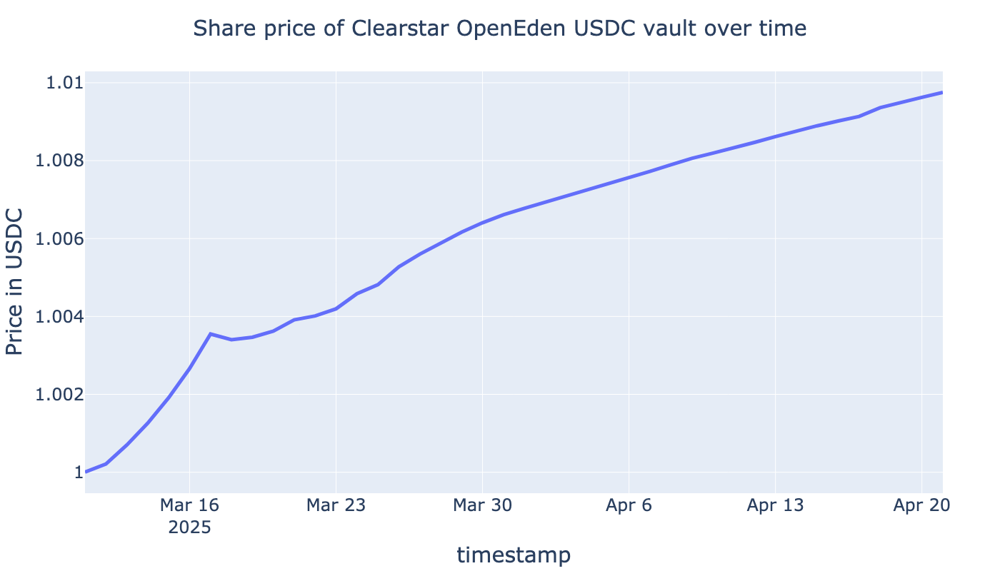

In [17]:
import plotly.express as px
price_series = vault_df["share_price"]

fig = px.line( 
    price_series, 
    title=f"Share price of {name} vault over time"
)
fig.update_layout(yaxis_title=f"Price in {vault_metadata['Denomination']}")
fig.update_layout(showlegend=False)
fig.show()

### Top vault: Net asset value

- What is the value of the all assets locked in the vault
- [Sometimes referred as TVL](https://tradingstrategy.ai/glossary/total-value-locked-tvl)



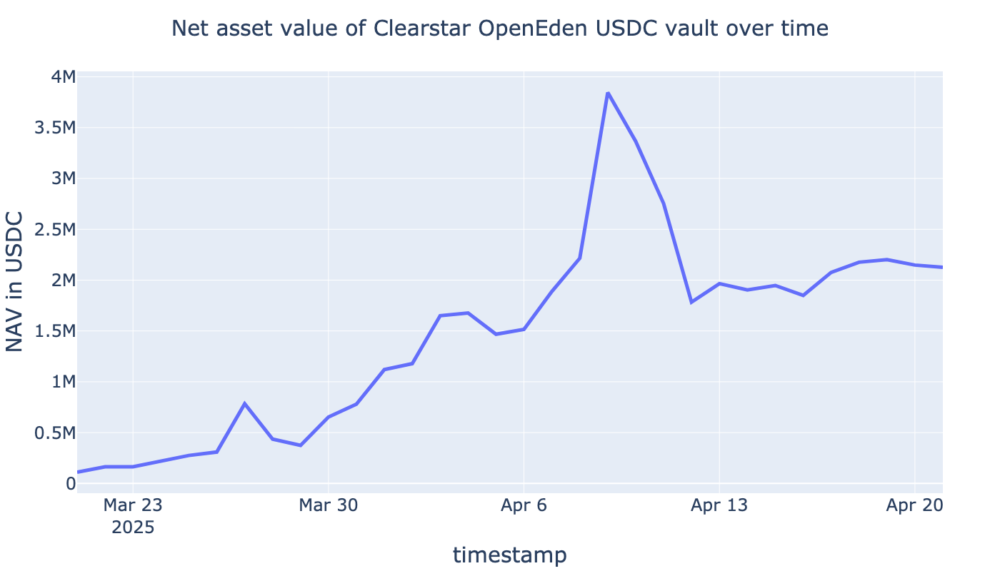

In [18]:
import plotly.express as px
nav_series = vault_df["total_assets"]

# Remove the uninteresting period when NAV is low
min_nav_threshold = 100_000
nav_series = nav_series[nav_series > min_nav_threshold]

fig = px.line( 
    nav_series, 
    title=f"Net asset value of {name} vault over time"
)
fig.update_layout(yaxis_title=f"NAV in {vault_metadata['Denomination']}")
fig.update_layout(showlegend=False)
fig.show()

### Top vault: Performance metrics

- Portfolio performance metrics for this vault

In [19]:
import warnings

with warnings.catch_warnings():  #  DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
    warnings.simplefilter(action='ignore', category=FutureWarning)  # yfinance: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
    try:
        # quantstats compatibility hack for IPython 8.x, ZMQInteractiveShell error
        # https://stackoverflow.com/a/15898875/315168
        get_ipython().magic = lambda x: x
        import quantstats
    except ImportError as e:
        quantstats = None
        

if quantstats:
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=RuntimeWarning)
        warnings.simplefilter(action='ignore', category=FutureWarning)
        
        metrics = quantstats.reports.metrics
        performance_metrics_df = metrics(
            daily_returns,
            benchmark=None,
            as_pct=display,  # QuantStats codebase is a mess
            periods_per_year=365,
            mode="full",
            display=False,
            internal=True,
        )    
    print(f"Portfolio performance metrics for {name} vault") 
    performance_metrics_df.rename(columns={"Strategy": name}, inplace=True)
    display(performance_metrics_df)
else:
    print("To show the portfolio performance metrics install quantstats: pip install quantstats")
    
    

Portfolio performance metrics for Clearstar OpenEden USDC vault


,Clearstar OpenEden USDC
Start Period,2025-03-11
End Period,2025-04-21
Risk-Free Rate,0.0%
Time in Market,98.0%
Cumulative Return,0.97%
CAGR﹪,6.14%
Sharpe,22.76
Prob. Sharpe Ratio,-
Smart Sharpe,13.3
Sortino,195.99


## Analyse other top vaults

- Check some other top vaults for benchmark
- We see from the share price


### Gains Network USDC (Polygon) #2421 vault

Examining vault Gains Network USDC (Polygon) #2421: 137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81, having 459 daily returns rows


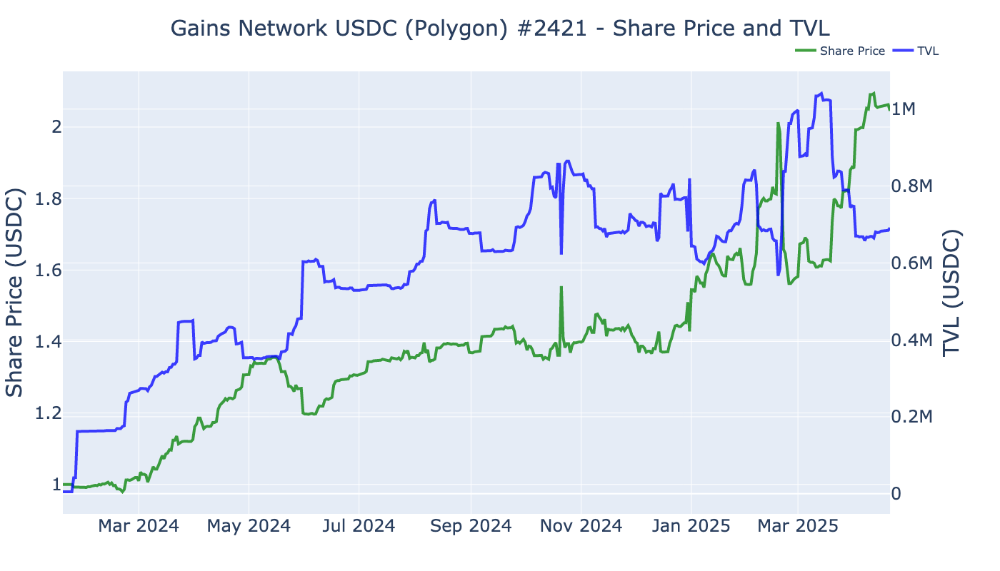

,Gains Network USDC (Polygon) #2421
Start Period,2024-01-19
End Period,2025-04-21
Risk-Free Rate,0.0%
Time in Market,91.0%
Cumulative Return,104.52%
CAGR﹪,48.24%
Sharpe,1.95
Prob. Sharpe Ratio,98.9%
Sortino,3.26
Sortino/√2,2.3


### USDC to yvUSDS Farmer vault

Examining vault USDC to yvUSDS Farmer: 1-0x602da189f5ada033e9ac7096fc39c7f44a77e942, having 192 daily returns rows


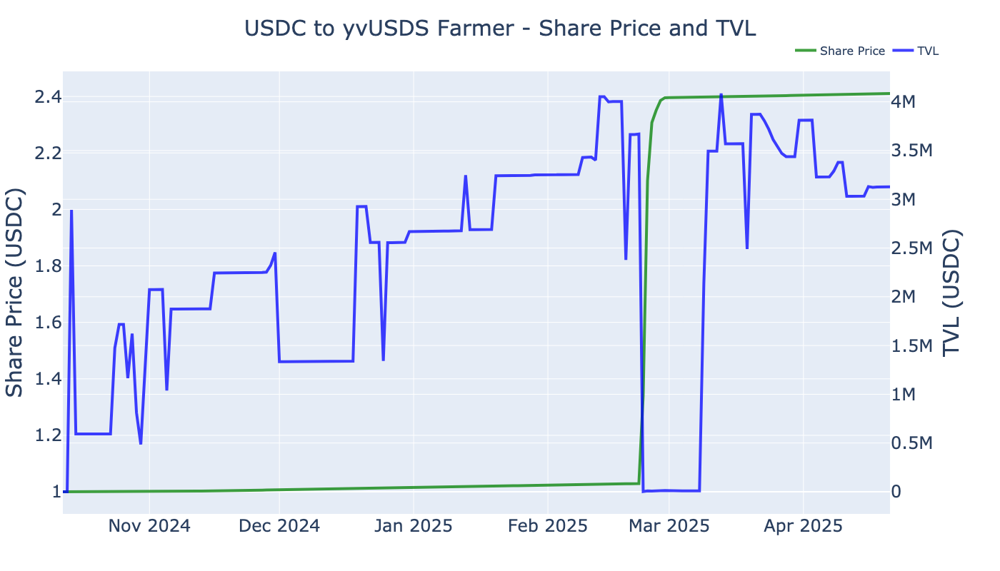

,USDC to yvUSDS Farmer
Start Period,2024-10-12
End Period,2025-04-21
Risk-Free Rate,0.0%
Time in Market,97.0%
Cumulative Return,141.04%
CAGR﹪,219.25%
Sharpe,2.21
Prob. Sharpe Ratio,99.99%
Sortino,-
Sortino/√2,-


### Staked avUSD vault

Examining vault Staked avUSD: 43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e, having 156 daily returns rows


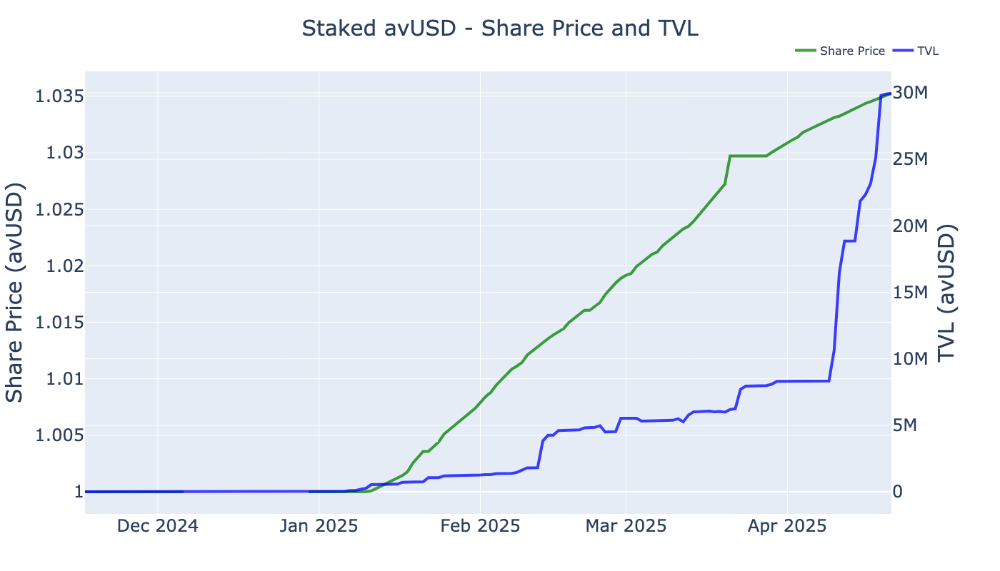

,Staked avUSD
Start Period,2024-11-17
End Period,2025-04-21
Risk-Free Rate,0.0%
Time in Market,59.0%
Cumulative Return,3.52%
CAGR﹪,5.79%
Sharpe,15.63
Prob. Sharpe Ratio,100.0%
Sortino,-
Sortino/√2,-


### Morpho Steakhouse USDT Compounder vault

Examining vault Morpho Steakhouse USDT Compounder: 1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5, having 103 daily returns rows


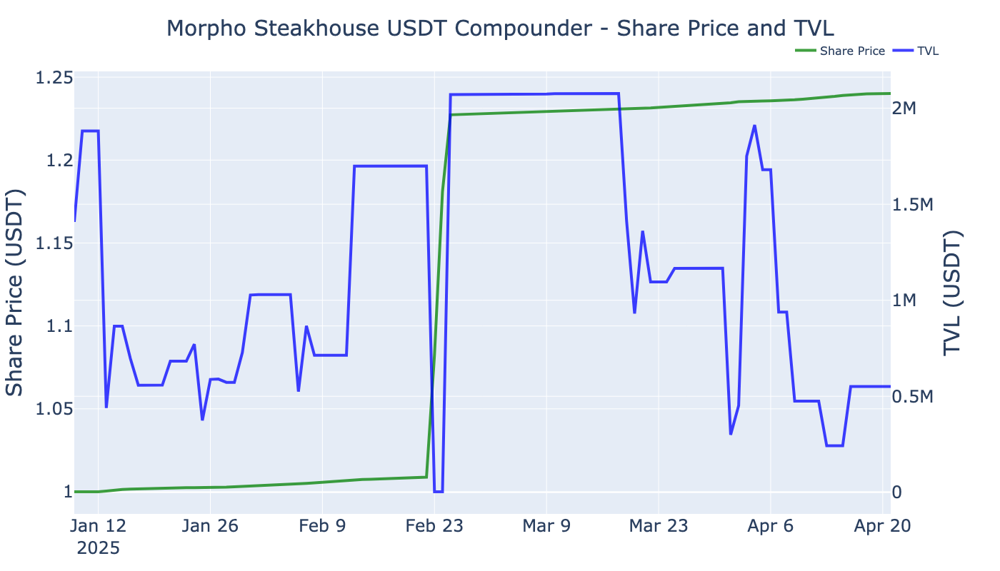

,Morpho Steakhouse USDT Compounder
Start Period,2025-01-09
End Period,2025-04-21
Risk-Free Rate,0.0%
Time in Market,99.0%
Cumulative Return,24.01%
CAGR﹪,70.19%
Sharpe,3.44
Prob. Sharpe Ratio,100.0%
Sortino,-
Sortino/√2,-


### kBOX vault

Examining vault kBOX: 56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813, having 98 daily returns rows


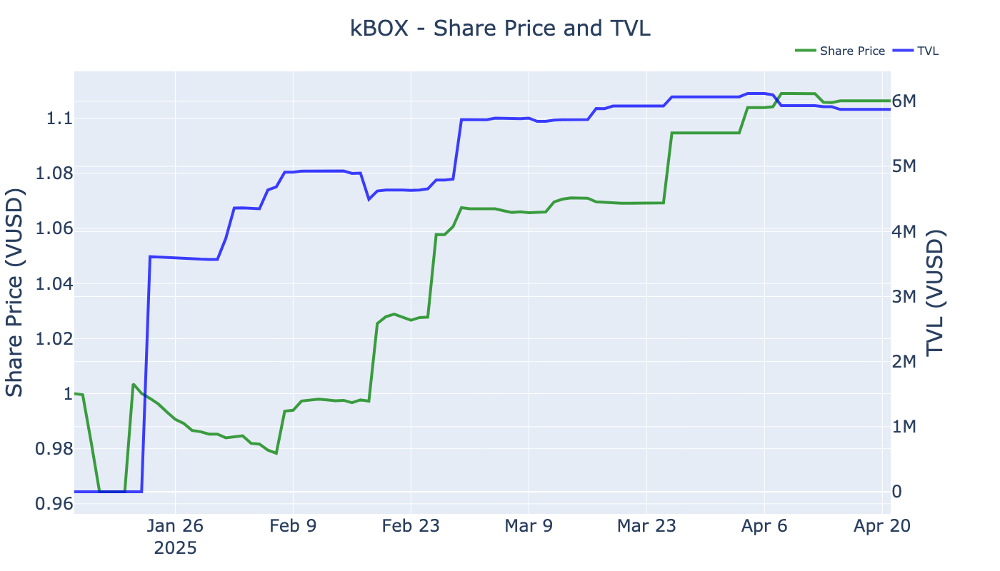

,kBOX
Start Period,2025-01-14
End Period,2025-04-21
Risk-Free Rate,0.0%
Time in Market,79.0%
Cumulative Return,10.63%
CAGR﹪,30.0%
Sharpe,2.84
Prob. Sharpe Ratio,96.93%
Sortino,7.5
Sortino/√2,5.31


### FARM_USDC.e vault

Examining vault FARM_USDC.e: 324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26, having 302 daily returns rows


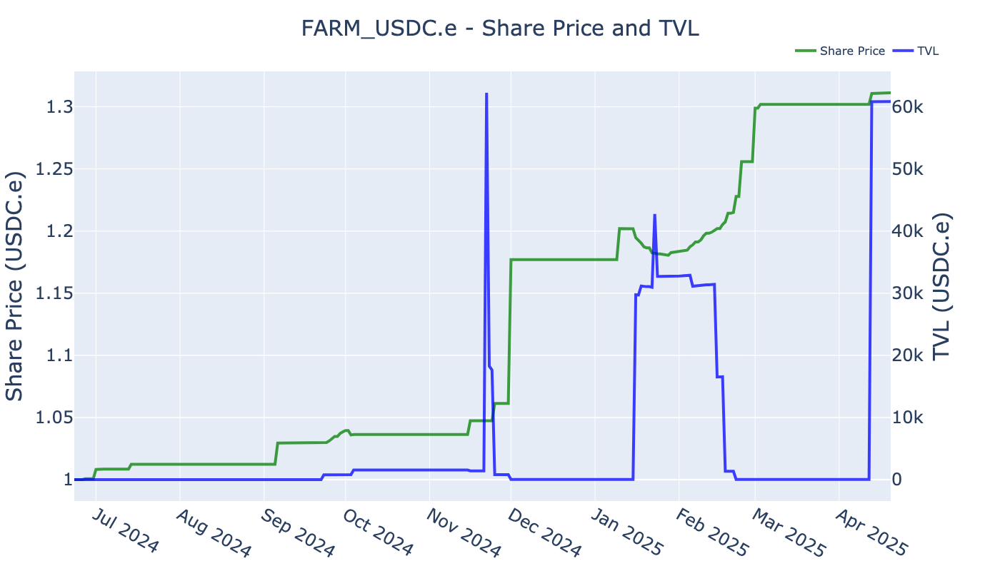

,FARM_USDC.e
Start Period,2024-06-23
End Period,2025-04-20
Risk-Free Rate,0.0%
Time in Market,21.0%
Cumulative Return,31.13%
CAGR﹪,25.47%
Sharpe,2.51
Prob. Sharpe Ratio,100.0%
Sortino,35.94
Sortino/√2,25.41


### 40op-USDC-Vault vault

Examining vault 40op-USDC-Vault: 10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957, having 57 daily returns rows


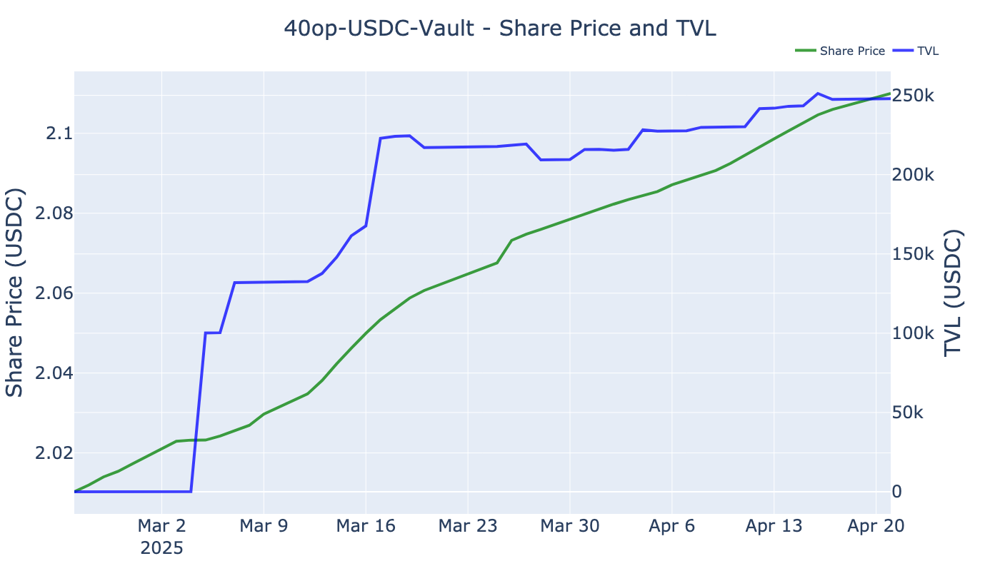

,40op-USDC-Vault
Start Period,2025-02-24
End Period,2025-04-21
Risk-Free Rate,0.0%
Time in Market,99.0%
Cumulative Return,4.96%
CAGR﹪,24.33%
Sharpe,33.48
Prob. Sharpe Ratio,100.0%
Sortino,-
Sortino/√2,-


In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots


ids = [
    # Gains USDC on Polygon
    # https://gains.trade/vaults/gUSDC
    "137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81",


    # Yearn USDC to yvUSDS Farmer
    # https://yearn.fi/vaults/1/0x602DA189F5aDa033E9aC7096Fc39C7F44a77e942
    "1-0x602da189f5ada033e9ac7096fc39c7f44a77e942",

    # Staked avUSD
    # https://app.avantprotocol.com/stake
    "43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e",

    # Morpho Steakhouse USDT Compounder
    # https://yearn.fi/vaults/1/0x0a4ea2bDe8496a878a7ca2772056a8e6fe3245c5,
    "1-0x0a4ea2bde8496a878a7ca2772056a8e6fe3245c5",

    # kBOX
    # ????
    "56-0x6e7a6eb5feec64bf6401a744757aba89c5c7e813",

    # Harvest finance ZKSync
    # 0x1B51eA0e4EDf4fac001D3CD55d3fAFc1D1f02f26
    # https://app.harvest.finance/zksync/0x1B51eA0e4EDf4fac001D3CD55d3fAFc1D1f02f26#details
    "324-0x1b51ea0e4edf4fac001d3cd55d3fafc1d1f02f26",


    # OP 
    # 40op-USDC-Vault
    # 
    "10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957"

]

for id in ids:
    name = vaults_by_id[id]['Name'] 

    display(Markdown(f"### {name} vault"))

    vault_df = returns_df.loc[returns_df["id"] == id]
    daily_returns = returns_df.loc[returns_df["id"] == id]["daily_returns"]
    vault_metadata = vaults_by_id[id]
    print(f"Examining vault {name}: {id}, having {len(daily_returns):,} daily returns rows")    
    nav_series = vault_df["total_assets"]

    import plotly.express as px
    price_series = vault_df["share_price"]

    # Create figure with secondary y-axis
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    # Add share price trace on primary y-axis
    fig.add_trace(
        go.Scatter(
            x=price_series.index, 
            y=price_series.values, 
            name="Share Price",
            line=dict(color='green', width=4),
            opacity=0.75  

        ),
        secondary_y=False,
    )

    # Add NAV trace on secondary y-axis
    fig.add_trace(
        go.Scatter(
            x=nav_series.index, 
            y=nav_series.values, 
            name="TVL",
            line=dict(color='blue', width=4),
            opacity=0.75  

        ),
        secondary_y=True,
    )

    # Set titles and labels
    fig.update_layout(
        title_text=f"{name} - Share Price and TVL",
        hovermode="x unified",
        template=pio.templates.default,
        showlegend=True,
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )

    # Set y-axes titles
    fig.update_yaxes(title_text=f"Share Price ({vault_metadata['Denomination']})", secondary_y=False)
    fig.update_yaxes(title_text=f"TVL ({vault_metadata['Denomination']})", secondary_y=True)

    # Show chart
    fig.show()

    # Show portfolio metrics
    if quantstats:
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=RuntimeWarning)
            warnings.simplefilter(action='ignore', category=FutureWarning)
            
            metrics = quantstats.reports.metrics
            performance_metrics_df = metrics(
                daily_returns,
                benchmark=None,
                as_pct=display,  # QuantStats codebase is a mess
                periods_per_year=365,
                mode="simple",
                display=False,
                internal=True,
            )        
            performance_metrics_df.rename(columns={"Strategy": name}, inplace=True)
            display(performance_metrics_df)

    